# MSM - FPCA + K-MEans

Packages

In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.linalg import eig
from scipy.interpolate import interp1d
from skfda import FDataGrid
from skfda.preprocessing.dim_reduction import FPCA
from skfda.representation.basis import BSplineBasis as BSpline
from typing import Optional, Dict, Tuple, List
cwd = Path.cwd()

# Model

In [ ]:
sns.set_theme(style="whitegrid", font_scale=1.1)

class EventAlignedFPCA_MSM_RMCE:
    """
    Event-aligned MSM for gait stability using FPCA + K-means:
    each stride (event-to-event) → functional representation → FPCA → K-means → Stable/Marginal/Unstable.
    """
    def __init__(self,
                 patient_id: str,
                 n_states: int = 3,
                 n_grid_points: int = 100,  # Number of points to interpolate each stride to
                 n_components: int = 7,
                 n_basis: int = 15):
        self.patient_id        = patient_id
        self.n_states          = n_states
        self.n_grid_points     = n_grid_points  # For interpolation
        self.n_components      = n_components
        self.n_basis           = n_basis
        self.scaler            = StandardScaler()
        self.metadata          = {}
        self.fpca              = None
        self.kmeans            = None
        self.transition_matrix = None
        self.stationary_dist   = None
        self.state_labels      = {0:"Stable", 1:"Marginally Stable", 2:"Unstable"}
        self.metrics_history   = None
        self.fdata             = None
        self.fpca_scores       = None
        self.stride_info       = None  # Store stride timing information
        self.validation_metrics = {}  # Store validation metrics

    def compute_event_aligned_functional_data(self, signal: np.ndarray, events: np.ndarray, fs: float) -> FDataGrid:
        """
        Convert event-aligned segments into functional data objects.
        Each segment is from one event to the next (e.g., foot strike to foot strike).
        """
        # Collect stride segments
        segments = []
        stride_times = []
        stride_durations = []
        valid_strides = []
        
        for i in range(len(events) - 1):
            start_time = events[i]
            end_time = events[i + 1]
            start_idx = int(start_time * fs)
            end_idx = int(end_time * fs)
            
            # Check bounds
            if start_idx >= 0 and end_idx <= len(signal):
                segment = signal[start_idx:end_idx]
                
                # Skip very short or very long strides (outliers)
                stride_duration = end_time - start_time
                if 0.5 < stride_duration < 2.0:  # Reasonable stride duration range
                    segments.append(segment)
                    stride_times.append(start_time)
                    stride_durations.append(stride_duration)
                    valid_strides.append(i)
        
        # Interpolate all segments to common grid
        interpolated_segments = []
        common_grid = np.linspace(0, 1, self.n_grid_points)
        
        for segment in segments:
            # Create interpolation function
            original_grid = np.linspace(0, 1, len(segment))
            f = interp1d(original_grid, segment, kind='cubic', fill_value='extrapolate')
            
            # Interpolate to common grid
            interpolated_segment = f(common_grid)
            interpolated_segments.append(interpolated_segment)
        
        # Convert to FDataGrid
        self.fdata = FDataGrid(
            data_matrix=np.array(interpolated_segments),
            grid_points=common_grid
        )
        
        # Store metadata - later for visuals and analysis
        self.metrics_history = pd.DataFrame({
            'stride_idx': range(len(segments)),
            'original_event_idx': valid_strides,
            'time': stride_times,
            'duration': stride_durations
        })
        
        # Store stride info for later use
        self.stride_info = {
            'events': events,
            'valid_strides': valid_strides,
            'fs': fs
        }
        
        print(f"Created functional data from {len(segments)} valid strides")
        print(f"Average stride duration: {np.mean(stride_durations):.3f}s ± {np.std(stride_durations):.3f}s")
        
        return self.fdata

    def apply_fpca(self) -> np.ndarray:
        """Apply Functional PCA to extract principal components."""
        try:
            # smooth the functional data using B-spline basis
            basis = BSpline(n_basis=self.n_basis, domain_range=(0, 1))
            
            smooth_fdata = self.fdata.to_basis(basis)
            
            # apply FPCA to smoothed data
            self.fpca = FPCA(n_components=self.n_components)
            self.fpca_scores = self.fpca.fit_transform(smooth_fdata)
        except:
            # If smoothing fails, apply FPCA directly to the discrete data
            print("Note: B-spline smoothing failed, using direct FPCA on discrete data")
            self.fpca = FPCA(n_components=self.n_components)
            self.fpca_scores = self.fpca.fit_transform(self.fdata)
        
        # add FPCA scores to metrics history
        for i in range(self.n_components):
            self.metrics_history[f'fpca_{i}'] = self.fpca_scores[:, i]
        
        # compute FPCA reconstruction error
        self._compute_fpca_reconstruction_error()
        
        return self.fpca_scores


    def _compute_fpca_reconstruction_error(self):
        """Compute reconstruction error from FPCA, plus NRMSE wrt range & std."""
        try:
            recon = self.fpca.inverse_transform(self.fpca_scores)
            if not isinstance(recon, FDataGrid):
                recon = recon.to_grid(self.fdata.grid_points)

            orig = self.fdata.data_matrix.squeeze()  # (n_strides, n_grid)
            rec  = recon.data_matrix.squeeze()

            # 1) MSE & RMSE
            mse  = np.mean((orig - rec)**2)
            rmse = np.sqrt(mse)
            self.validation_metrics['fpca_reconstruction_mse'] = mse
            self.validation_metrics['fpca_reconstruction_rmse'] = rmse

            # 2) Signal range & std
            sig_min   = orig.min()
            sig_max   = orig.max()
            sig_range = sig_max - sig_min
            sig_std   = orig.std()
            self.validation_metrics.update({
                'signal_min': sig_min,
                'signal_max': sig_max,
                'signal_range': sig_range,
                'signal_std': sig_std,
            })

            # 3) Normalized errors
            nrmse_range = rmse / sig_range if sig_range>0 else np.nan
            nrmse_std   = rmse / sig_std   if sig_std>0   else np.nan
            self.validation_metrics['nrmse_range'] = nrmse_range
            self.validation_metrics['nrmse_std']   = nrmse_std

            print(f"FPCA reconstruction MSE: {mse:.4f}, RMSE: {rmse:.4f}")
            print(f"Signal range: {sig_range:.4f}, σ: {sig_std:.4f}")
            print(f"NRMSE (range): {nrmse_range:.2%},  NRMSE (σ): {nrmse_std:.2%}")

        except Exception as e:
            print(f"Errror: {e}")
            self.validation_metrics['fpca_reconstruction_mse'] = np.nan
    
    
    def _compute_kmeans_variance_explained(self):
        """ Compute variance explained by K-means clustering on FPCA scores."""
        # Pull out the FPCA scores 
        X = self.fpca_scores[:, :self.n_components]
        labels = self.metrics_history['state'].values
        
        # 1) global mean & TSS
        global_mean = X.mean(axis=0)
        TSS = np.sum((X - global_mean) ** 2)
        
        # 2) within‑cluster sum of squares (WSS)
        WSS = 0.0
        for k in range(self.n_states):
            mask = labels == k
            if mask.sum() == 0:
                continue
            cluster_data = X[mask]
            cluster_mean = cluster_data.mean(axis=0)
            WSS += np.sum((cluster_data - cluster_mean) ** 2)
        
        # 3) fraction explained
        R2 = 1 - WSS / TSS if TSS > 0 else 0.0
        self.validation_metrics['fpca_variance_explained_by_clustering'] = R2
        print(f"FPCA‑KMeans variance explained: {R2:.1%}")

    def identify_stability_states(self) -> np.ndarray:
        """Apply K-means clustering to FPCA scores to identify states."""
        
        # Standardize FPCA scores
        X = self.scaler.fit_transform(self.fpca_scores[:,:self.n_components])  
        
        # Apply K-means
        self.kmeans = KMeans(n_clusters=self.n_states, random_state=42)
        raw_states = self.kmeans.fit_predict(X)
        
        # Order states by distance from origin (stability proxy)
        cluster_centers = self.kmeans.cluster_centers_
        norms = np.linalg.norm(cluster_centers, axis=1)
        order = np.argsort(norms)
        
        # Remap states to ensure 0=stable, 2=unstable
        state_mapping = {old: new for new, old in enumerate(order)}
        states = np.array([state_mapping[s] for s in raw_states])
        
        self.metrics_history['state'] = states
        
        # Compute clustering validation metric
        self._compute_clustering_silhouette_score(X, states)
        self.metrics_history['state'] = states
        
        
        self._compute_clustering_silhouette_score(X, states)
       
        self._compute_kmeans_variance_explained()
    
        return states

    def _compute_clustering_silhouette_score(self, X: np.ndarray, labels: np.ndarray):
        """Compute silhouette score for clustering validation."""
        
        try:
            # Compute silhouette score
            sil_score = silhouette_score(X, labels)
            self.validation_metrics['clustering_silhouette_score'] = sil_score
            
            print(f"Clustering silhouette score: {sil_score:.3f}")
            
            # Interpretation
            if sil_score > 0.7:
                interpretation = "Strong clustering"
            elif sil_score > 0.5:
                interpretation = "Reasonable clustering"
            elif sil_score > 0.25:
                interpretation = "Weak clustering"
            else:
                interpretation = "Poor clustering"
            
            print(f"Clustering quality: {interpretation}")
            
        except Exception as e:
            print(f"Warning: Could not compute silhouette score: {e}")
            self.validation_metrics['clustering_silhouette_score'] = np.nan

    def compute_transition_matrix(self, states: np.ndarray) -> np.ndarray:
        """Compute state transition probabilities."""

        T = np.zeros((self.n_states, self.n_states))
        for a, b in zip(states[:-1], states[1:]):
            T[a, b] += 1
        
        # Normalize rows
        row_sums = T.sum(axis=1)
        row_sums[row_sums == 0] = 1
        T = T / row_sums[:, None]
        
        self.transition_matrix = T
        return T

    def compute_stationary_distribution(self) -> np.ndarray:
        """Compute stationary distribution of the Markov chain."""

        vals, vecs = eig(self.transition_matrix.T)
        idx = np.argmin(np.abs(vals - 1))
        pi = np.real(vecs[:, idx])
        pi = pi / pi.sum()
        self.stationary_dist = np.abs(pi)
        return self.stationary_dist

    def compute_mean_dwell_times(self) -> np.ndarray:
        """Compute mean dwell time in each state."""

        τ = np.zeros(self.n_states)
        for i in range(self.n_states):
            p = self.transition_matrix[i, i]
            τ[i] = np.inf if p >= 1 else 1 / (1 - p)
        return τ

    def compute_stability_metrics(self) -> dict:
        """Compute overall stability metrics."""

        df = self.metrics_history
        out = {'patient_id': self.patient_id}
        
        # State fractions
        for i in range(self.n_states):
            out[f'frac_state_{i}'] = (df.state == i).mean()
        
        # Mean FPCA scores per state
        for i in range(self.n_states):
            state_data = df[df.state == i]
            for j in range(self.n_components):
                out[f'mean_fpca_{j}_state_{i}'] = state_data[f'fpca_{j}'].mean()
        
        # Mean stride duration per state
        for i in range(self.n_states):
            state_data = df[df.state == i]
            out[f'mean_duration_state_{i}'] = state_data['duration'].mean()
        
        # Add validation metrics
        out.update(self.validation_metrics)
        
        return out

    def visualize_patient_analysis(self):
        """2×2 summary figure with FPCA results and transitions."""
        df = self.metrics_history.copy()
        names = list(self.state_labels.values())
        colors = sns.color_palette(n_colors=self.n_states)
        
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        
        # 1) FPCA explained variance
        if self.fpca is not None and hasattr(self.fpca, 'explained_variance_ratio_'):
            explained_var = self.fpca.explained_variance_ratio_
            pc_labels = [f'PC{i+1}' for i in range(len(explained_var))]
            axes[0, 0].bar(pc_labels, explained_var, color='skyblue')
            axes[0, 0].set_title('FPCA Explained Variance Ratio')
            axes[0, 0].set_ylabel('Variance Explained')
            for i, v in enumerate(explained_var):
                axes[0, 0].text(i, v + 0.01, f'{v:.1%}', ha='center')
                
        # 2) Transition matrix heatmap
        sns.heatmap(self.transition_matrix,
                    annot=True, fmt=".2f",
                    xticklabels=names, yticklabels=names,
                    cmap="Blues", ax=axes[0, 1])
        axes[0, 1].set_title("Transition Probabilities")
        
        # Add silhouette score
        if 'clustering_silhouette_score' in self.validation_metrics:
            sil_score = self.validation_metrics['clustering_silhouette_score']
            axes[0, 1].text(0.02, 0.98, f'Silhouette Score: {sil_score:.3f}', 
                           transform=axes[0, 1].transAxes, va='top',
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        # 3) FPCA scores scatter (first 2 PCs)
        if self.n_components >= 2 and 'fpca_0' in df.columns and 'fpca_1' in df.columns:
            for i, (state, name) in enumerate(self.state_labels.items()):
                mask = df.state == state
                axes[1, 0].scatter(df.loc[mask, 'fpca_0'], 
                                 df.loc[mask, 'fpca_1'],
                                 label=name, color=colors[i], alpha=0.6)
            axes[1, 0].set_xlabel('FPCA Component 1')
            axes[1, 0].set_ylabel('FPCA Component 2')
            axes[1, 0].set_title('State Distribution in FPCA Space')
            axes[1, 0].legend()
        
        # 4) Stride duration by state
        # More informative than stationary distribution for event-aligned data
        duration_data = []
        for state, name in self.state_labels.items():
            durations = df[df.state == state]['duration'].values
            duration_data.extend([{'State': name, 'Duration': d} for d in durations])
        
        duration_df = pd.DataFrame(duration_data)
        # sns.boxplot(data=duration_df, x='State', y='Duration', palette=colors, ax=axes[1, 1])
        sns.boxplot(
            data=duration_df,
            x='State',
            y='Duration',
            hue='State',       
            palette=colors,
            dodge=False,        
            ax=axes[1, 1]
                )   
        axes[1, 1].set_title('Stride Duration by State')
        axes[1, 1].set_ylabel('Duration (s)')
        
        plt.tight_layout()
        plt.show()

    def visualize_functional_modes(self):
        """Visualize the functional principal components."""
        if self.fpca is None:
            return
        
        if not hasattr(self.fpca, 'mean_') or not hasattr(self.fpca, 'components_'):
            print("FPCA components not available for visualization")
            return
        
        fig, axes = plt.subplots(1, min(3, self.n_components), 
                                figsize=(5*min(3, self.n_components), 4))
        
        if self.n_components == 1:
            axes = [axes]
        
        # Create evaluation grid
        grid = np.linspace(0, 1, 100)
        
        try:
            # Get mean function and components
            mean_func = self.fpca.mean_
            
            # Evaluate mean function on grid
            mean_values = mean_func(grid).flatten()
            
            for i in range(min(3, self.n_components)):
                # Get principal component
                pc = self.fpca.components_[i]
                pc_values = pc(grid).flatten()
                
                # Plot mean plus PC
                axes[i].plot(grid, mean_values, 'k-', 
                            label='Mean', linewidth=2)
                
                # Scale by explained variance if available
                if hasattr(self.fpca, 'explained_variance_'):
                    scale = np.sqrt(self.fpca.explained_variance_[i])
                else:
                    scale = 1.0
                    
                axes[i].plot(grid, mean_values + 2*scale*pc_values, 
                            'b--', label='+2 SD', alpha=0.7)
                axes[i].plot(grid, mean_values - 2*scale*pc_values, 
                            'r--', label='-2 SD', alpha=0.7)
                
                if hasattr(self.fpca, 'explained_variance_ratio_'):
                    axes[i].set_title(f'PC{i+1} ({self.fpca.explained_variance_ratio_[i]:.1%} var)')
                else:
                    axes[i].set_title(f'PC{i+1}')
                    
                axes[i].set_xlabel('Normalized Stride Time')
                axes[i].legend()
        except Exception as e:
            print(f"Error visualizing functional modes: {e}")
            for ax in axes:
                ax.text(0.5, 0.5, 'Functional modes\nnot available', 
                       ha='center', va='center', transform=ax.transAxes)
        
        plt.tight_layout()
        plt.show()

    def visualize_stride_alignment(self, signal: np.ndarray, max_strides: int = 20):
        """Visualize how strides are aligned and colored by state."""
        if self.stride_info is None:
            return
        
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
        
        colors = sns.color_palette(n_colors=self.n_states)
        events = self.stride_info['events']
        fs = self.stride_info['fs']
        
        # Original signal with event markers and state colors
        time_axis = np.arange(len(signal)) / fs
        ax1.plot(time_axis, signal, 'k-', alpha=0.5, linewidth=0.5)
        
        # Add stride coloring
        for idx, stride_idx in enumerate(self.stride_info['valid_strides'][:max_strides]):
            if stride_idx < len(events) - 1:
                start_time = events[stride_idx]
                end_time = events[stride_idx + 1]
                state = int(self.metrics_history.iloc[idx]['state'])  # Convert to int
                ax1.axvspan(start_time, end_time, color=colors[state], alpha=0.3)
        
        # Add event markers
        ax1.scatter(events, np.interp(events, time_axis, signal), 
                   color='red', s=50, zorder=5, label='Foot Strikes')
        ax1.set_xlabel('Time (s)')
        ax1.set_ylabel('Signal Value')
        ax1.set_title('Original Signal with Event-Aligned State Classification')
        ax1.legend()
        
        # Overlaid normalized strides colored by state
        grid = np.linspace(0, 1, self.n_grid_points)
        for i in range(min(max_strides, len(self.fdata))):
            state = int(self.metrics_history.iloc[i]['state'])  # Convert to int
            ax2.plot(grid, self.fdata[i].data_matrix[0], 
                    color=colors[state], alpha=0.5, linewidth=1)
        
        # Add mean curves per state
        for state, name in self.state_labels.items():
            state_mask = self.metrics_history['state'] == state
            if state_mask.sum() > 0:
                state_curves = self.fdata[state_mask].data_matrix
                mean_curve = np.mean(state_curves, axis=0)
                ax2.plot(grid, mean_curve, color=colors[state], 
                        linewidth=3, label=name)
        
        ax2.set_xlabel('Normalized Stride Time (0=strike, 1=next strike)')
        ax2.set_ylabel('Signal Value')
        ax2.set_title('Event-Aligned Strides by State')
        ax2.legend()
        
        plt.tight_layout()
        plt.show()

    def fit(self, signal: np.ndarray, events: np.ndarray, fs: float) -> 'EventAlignedFPCA_MSM_RMCE':
        """
        Complete pipeline: signal + events → functional data → FPCA → clustering → MSM.
        """
        print(f"Processing patient {self.patient_id} with event-aligned strides...")
        
        # 1. Create functional data from event-aligned segments
        print("Creating event-aligned functional data...")
        self.compute_event_aligned_functional_data(signal, events, fs)
        
        # 2. Apply FPCA
        print(f"Applying FPCA with {self.n_components} components...")
        self.apply_fpca()
        
        # 3. Identify states via K-means
        print("Identifying stability states via K-means...")
        states = self.identify_stability_states()
        
        # 4. Build Markov model
        print("Computing transition matrix...")
        self.compute_transition_matrix(states)
        
        # 5. Compute stationary distribution
        print("Computing stationary distribution...")
        self.compute_stationary_distribution()
             
        metrics = self.compute_stability_metrics()
        print(f"\nStability metrics for {self.patient_id}:")
        for key, value in metrics.items():
            if key == 'patient_id':
                continue
            # if it's an array, summarize it rather than try to format directly
            if isinstance(value, np.ndarray):
                print(f"  {key}: array, n={value.size}, mean={value.mean():.3f}, std={value.std():.3f}")
            else:
                print(f"  {key}: {value:.3f}")

        # Print validation summary
        print(f"\nValidation Summary:")
       
        if 'fpca_reconstruction_rmse' in self.validation_metrics:
            rmse = self.validation_metrics['fpca_reconstruction_rmse']
            nrmse_r = self.validation_metrics.get('nrmse_range', np.nan)
            nrmse_s = self.validation_metrics.get('nrmse_std',   np.nan)
            print(f"  FPCA reconstruction → RMSE = {rmse:.4f}  "
            f"(NRMSE range = {nrmse_r:.2%}, NRMSE σ = {nrmse_s:.2%})")
        sil = self.validation_metrics.get('clustering_silhouette_score', None)
        if sil is not None and np.isscalar(sil):
            print(f"  Clustering quality: Silhouette = {sil:.3f}")

        return self
    def plot_fpca_reconstruction_error_distribution(self, bins: int = 20):
        """
        Histogram of per‑stride FPCA reconstruction MSE to spot outliers.
        """
        errors = self.validation_metrics.get('fpca_reconstruction_mse_per_stride')
        if errors is None:
            print("No per‑stride MSE data available.")
            return

        plt.figure(figsize=(8, 4))
        sns.histplot(errors, bins=bins, kde=True)
        plt.title('Per‑Stride FPCA Reconstruction MSE')
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.tight_layout()
        plt.show()


    def plot_silhouette_samples(self):
        """
        Scatter of silhouette coefficient per stride.
        """
        from sklearn.metrics import silhouette_samples
        from sklearn.preprocessing import StandardScaler

        # Rescale all PCs afresh
        X = StandardScaler().fit_transform(self.fpca_scores)
        labels = self.metrics_history['state'].values
        sil_vals = silhouette_samples(X, labels)

        self.validation_metrics['silhouette_samples'] = sil_vals

        plt.figure(figsize=(10, 5))
        palette = sns.color_palette(n_colors=self.n_states)
        sns.scatterplot(
            x=np.arange(len(sil_vals)),
            y=sil_vals,
            hue=labels,
            palette=palette,
            legend='brief',
            alpha=0.7
        )
        plt.axhline(sil_vals.mean(), color='k', linestyle='--',
                    label=f'Mean = {sil_vals.mean():.3f}')
        plt.title('Silhouette Coefficient per Stride')
        plt.xlabel('Stride Index')
        plt.ylabel('Silhouette Coefficient')
        plt.legend(title='State')
        plt.tight_layout()
        plt.show()


    def plot_silhouette_analysis(self):
        """
        Classic silhouette‑analysis bar plot by cluster.
        """
        from sklearn.metrics import silhouette_samples, silhouette_score
        from sklearn.preprocessing import StandardScaler
        import matplotlib.cm as cm

        X = StandardScaler().fit_transform(self.fpca_scores)
        y = self.metrics_history['state'].values
        sil_vals = silhouette_samples(X, y)
        sil_avg  = silhouette_score(X, y)

        fig, ax1 = plt.subplots(figsize=(8, 5))
        y_lower = 10
        for i in range(self.n_states):
            ith_sil = np.sort(sil_vals[y == i])
            size_i  = ith_sil.shape[0]
            if size_i == 0:
                continue
            y_upper = y_lower + size_i
            color   = cm.nipy_spectral(float(i) / self.n_states)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_sil,
                              facecolor=color, edgecolor=color, alpha=0.7)
            ax1.text(-0.05, y_lower + 0.5 * size_i, f"State {i}")
            y_lower = y_upper + 10

        ax1.axvline(sil_avg, color="red", linestyle="--",
                    label=f'Average silhouette = {sil_avg:.3f}')
        ax1.set_title("Silhouette Analysis per State")
        ax1.set_xlabel("Silhouette Coefficient")
        ax1.set_ylabel("Cluster")
        ax1.set_yticks([])
        ax1.legend(loc='upper right')
        plt.tight_layout()
        plt.show()

        
    def plot_all_feature_correlations(self):
        # 1) gather metadata columns
        meta_cols = ['stride_idx', 'time', 'duration']
        
        # 2) FPCA score columns
        fpca_cols = [f"fpca_{i}" for i in range(self.n_components)]
        
        # 3) validation metric columns (filter numeric entries)
        val_cols = [k for k, v in self.validation_metrics.items() 
                    if isinstance(v, (int, float, np.floating, np.integer))]
        
        # 4) combine and drop any that aren't in metrics_history
        all_cols = [c for c in (meta_cols + fpca_cols + val_cols) 
                    if c in self.metrics_history.columns]
        
        # build the DataFrame
        df = self.metrics_history[all_cols].copy()
        
        # if some validation metrics are arrays, skip them
        # (we only plot scalar metrics)
        
        # 5) compute correlation matrix
        corr = df.corr()
        
        # 6) plot heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(
            corr,
            annot=True,
            fmt=".2f",
            cmap="vlag",
            center=0,
            square=True,
            cbar_kws={"shrink": .8},
            linewidths=0.5
        )
        plt.title(f"Patient {self.patient_id} — All Feature Correlations")
        plt.xticks(rotation=45, ha="right")
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

        
    def plot_features_vs_clusters(self):
        # 1) pick numeric features (e.g., duration, FPCA scores, RMSE, silhouette…)
        meta_cols  = ['duration']
        fpca_cols  = [f"fpca_{i}" for i in range(self.n_components)]
        val_cols   = [k for k, v in self.validation_metrics.items() 
                    if isinstance(v, (int, float, np.integer, np.floating))]
        feat_cols  = [c for c in (meta_cols + fpca_cols + val_cols) 
                    if c in self.metrics_history.columns]
        
        df_feats   = self.metrics_history[feat_cols].copy()
        
        # 2) one‑hot encode the cluster labels
        df_states  = pd.get_dummies(self.metrics_history['state'], 
                                    prefix='state')
        
        # 3) combine
        df_all     = pd.concat([df_feats, df_states], axis=1)
        
        # 4) compute correlation
        corr = df_all.corr()
        
        # 5) plot
        plt.figure(figsize=(10,8))
        sns.heatmap(
            corr.loc[feat_cols, df_states.columns],   # show only feature vs state correlations
            annot=True, fmt=".2f", cmap="vlag", center=0,
            cbar_kws={"shrink":.8}
        )
        plt.title(f"Patient {self.patient_id} — Feature vs. Cluster Correlations")
        plt.xlabel("Cluster (one‑hot)")
        plt.ylabel("Features")
        plt.tight_layout()
        plt.show()



In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal


# Model fit - Young

### 13

Found 179 foot strikes
Time range: 11.96s to 287.53s
Processing patient Y13 with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 167 valid strides
Average stride duration: 1.536s ± 0.083s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 6.6071, RMSE: 2.5704
Signal range: 106.0969, σ: 25.3769
NRMSE (range): 2.42%,  NRMSE (σ): 10.13%
Identifying stability states via K-means...
Clustering silhouette score: 0.407
Clustering quality: Weak clustering
Clustering silhouette score: 0.407
Clustering quality: Weak clustering
FPCA‑KMeans variance explained: 65.9%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for Y13:
  frac_state_0: 0.695
  frac_state_1: 0.198
  frac_state_2: 0.108
  mean_fpca_0_state_0: -4.107
  mean_fpca_1_state_0: -3.304
  mean_fpca_2_state_0: 0.485
  mean_fpca_0_state_1: 22.992
  mean_fpca_1_state_1: 3.857
  mean_fpca_2_state_1: -0.922
  mean_fpca_0_state_2: -15.687
  mean_fpca_

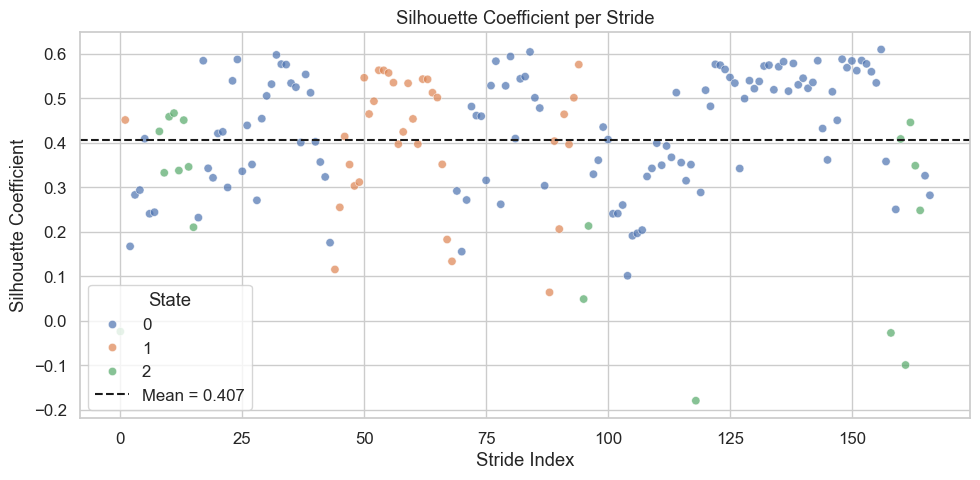

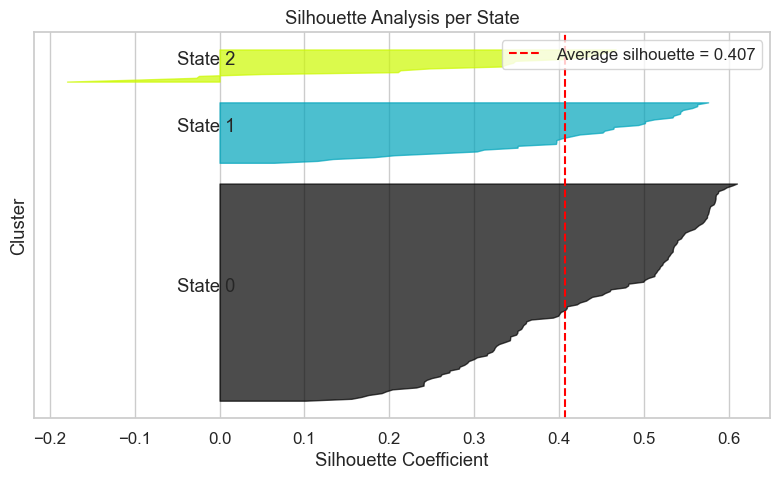

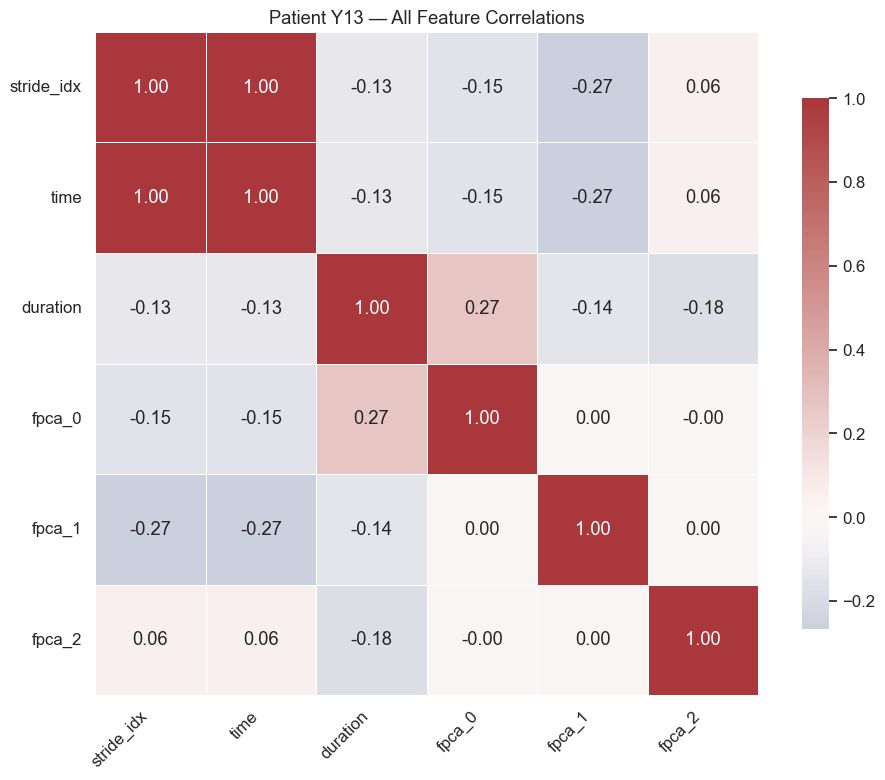

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\926418647.py:738: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
c:\Users\Natascha\OneDrive - Hochschule Luzern\Thesis_Dokus\DART\RepoCode\python-gaitalytics\nonlinear-metrics-calculation\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


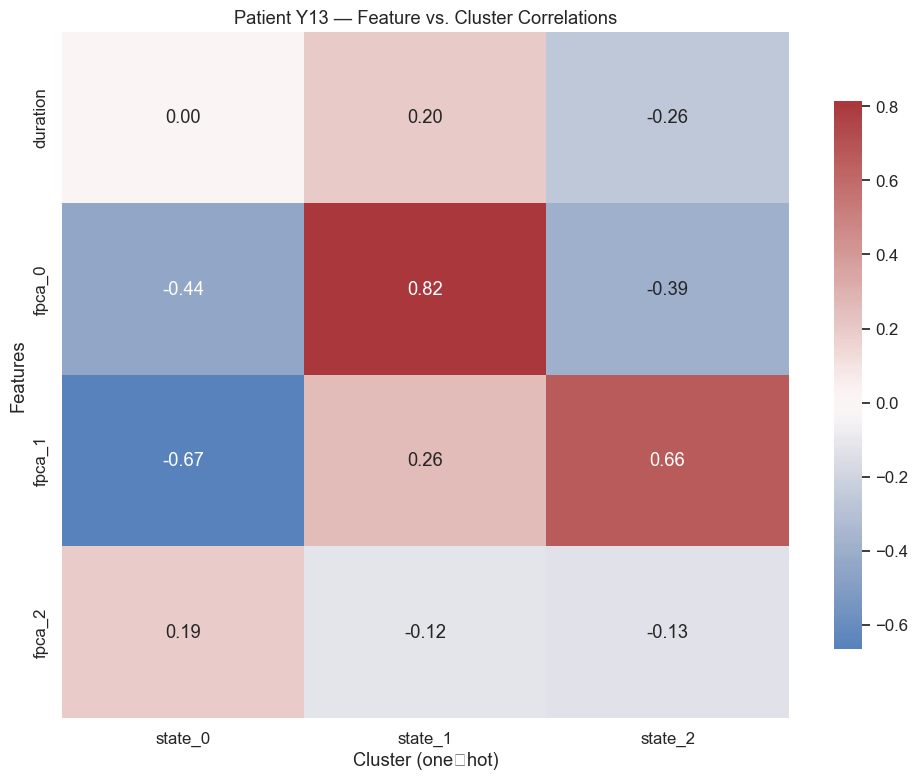


Visualizing stride alignment...


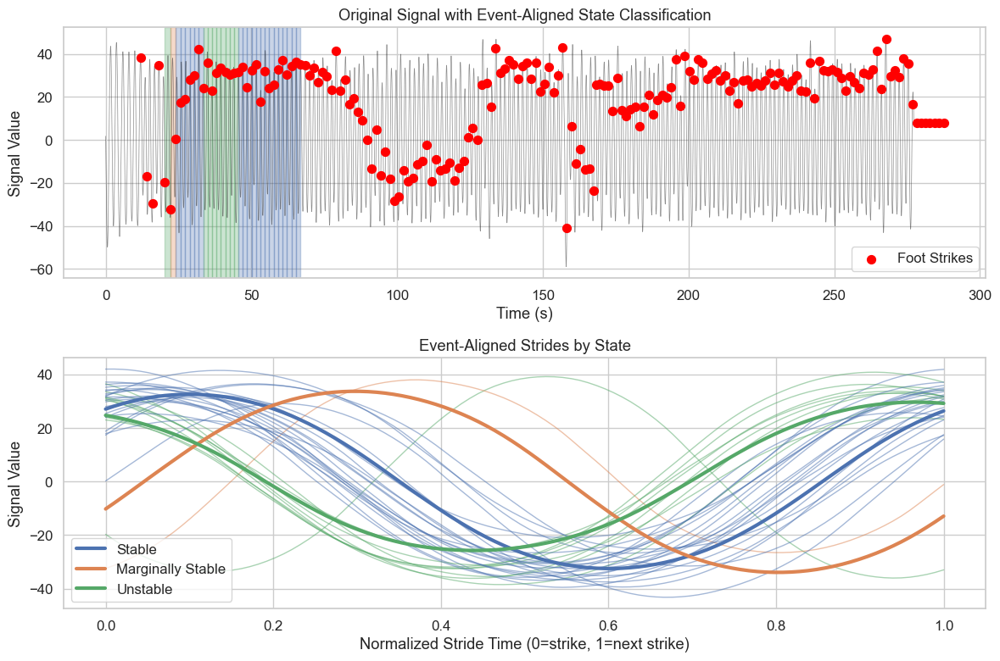

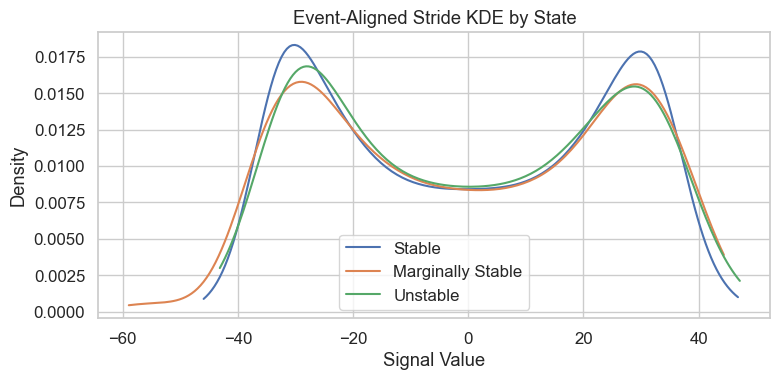

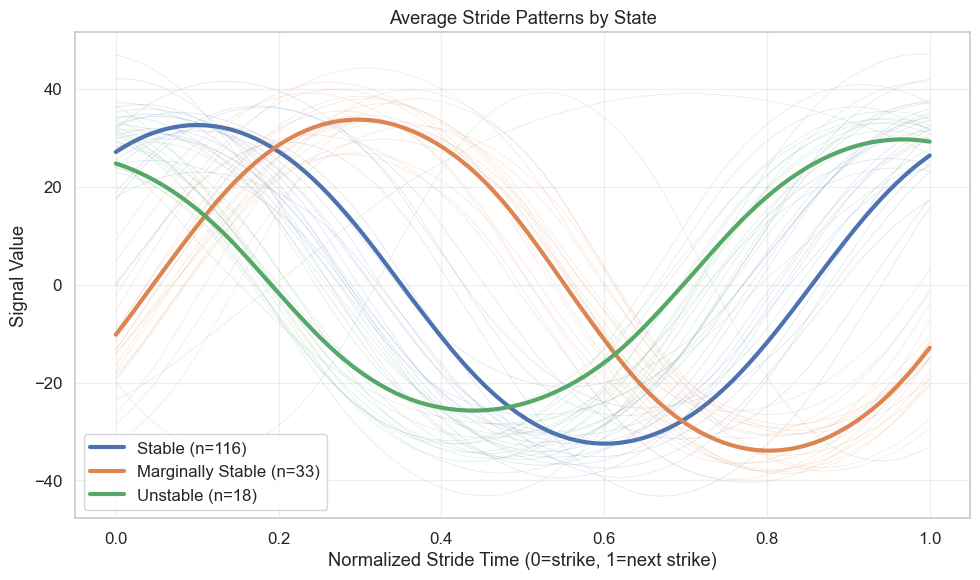

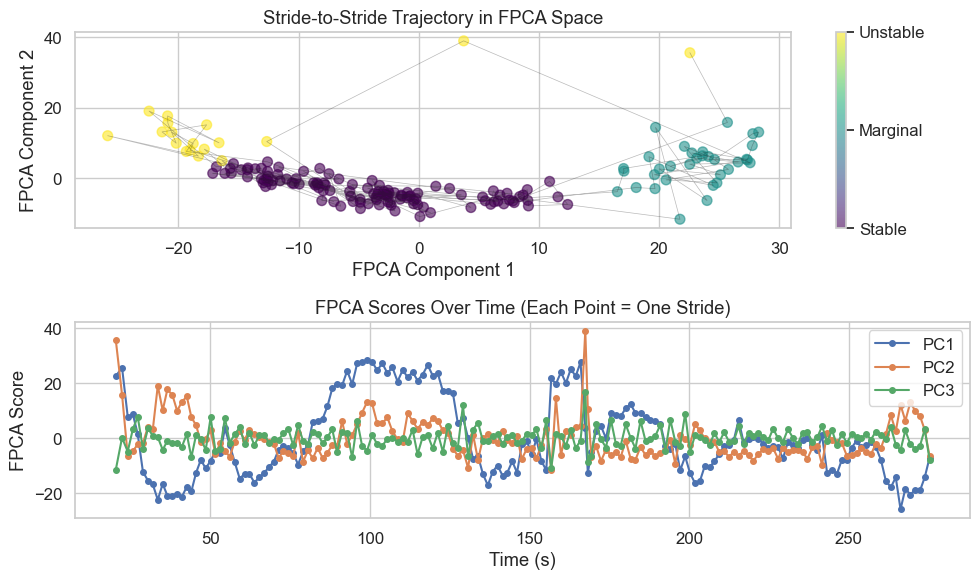

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\2393483182.py:162: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


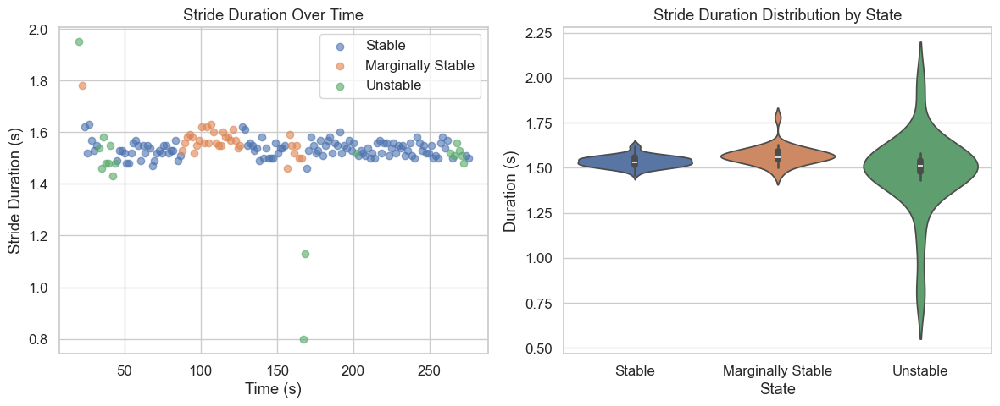

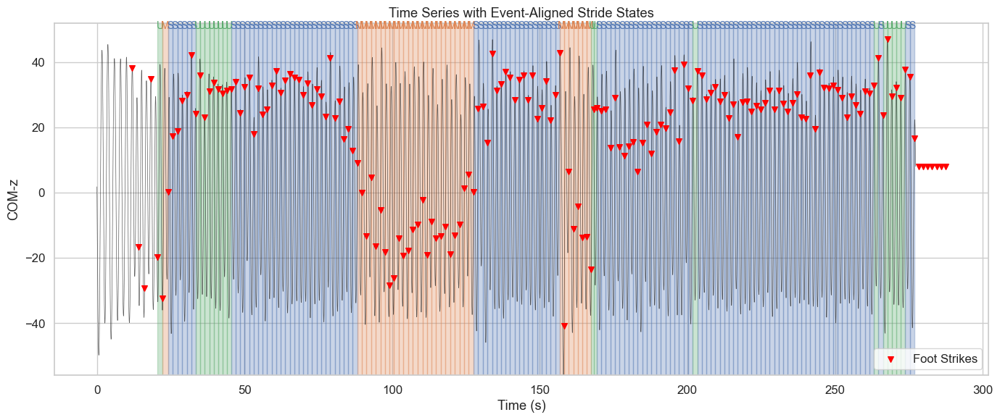


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 167
Average stride duration: 1.536 ± 0.083s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.407
  → Weak clustering - states may overlap

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.948 0.017 0.035]
 [0.061 0.909 0.03 ]
 [0.278 0.056 0.667]]

Stationary Distribution Π:
[0.715 0.193 0.092]

Mean Dwell Times τ (strides):
[19.167 11.     3.   ]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.695
  Mean duration: 1.536s
  Duration std: 0.031s
  Mean PC1: -4.107
  Mean PC2: -3.304
  Mean PC3: 0.485

Marginally Stable:
  Fraction of strides: 0.198
  Mean duration: 1.569s
  Duration std: 0.053s
  Mean PC1: 22.992
  Mean PC2: 3.857
  Mean PC3: -0.922

Unstable:
  Fraction of strides: 0.108
  Mean duration: 1.473s
  Duration std: 0.222s
  Mean PC1: -15.687
  Mean PC2: 14.224
  Mean PC3: -1.432

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 71.8% (cumulative: 71

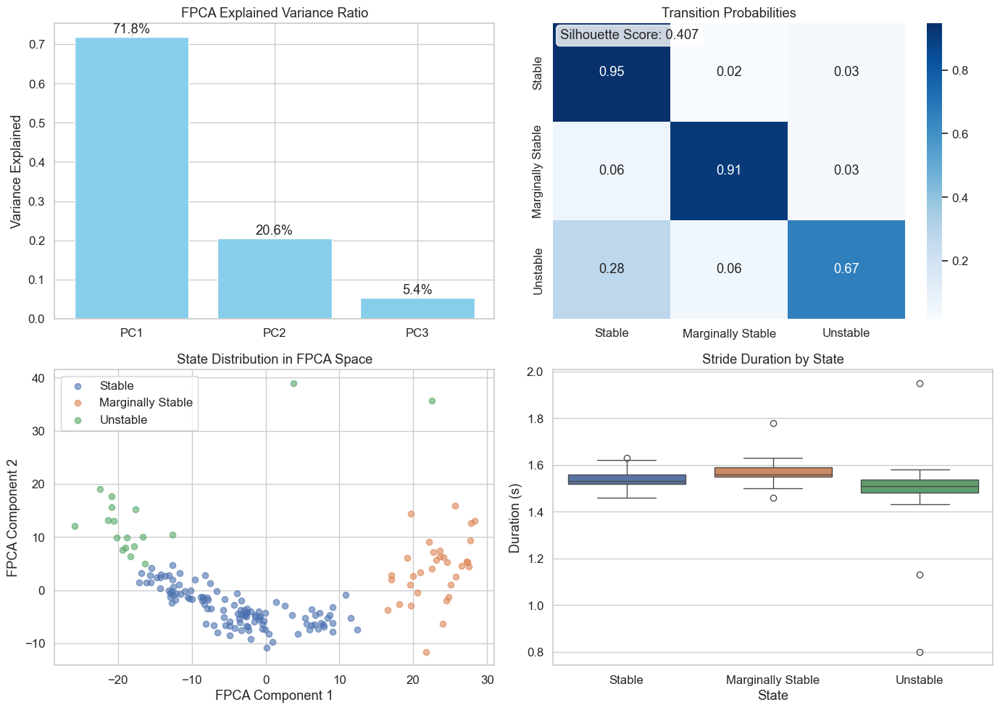

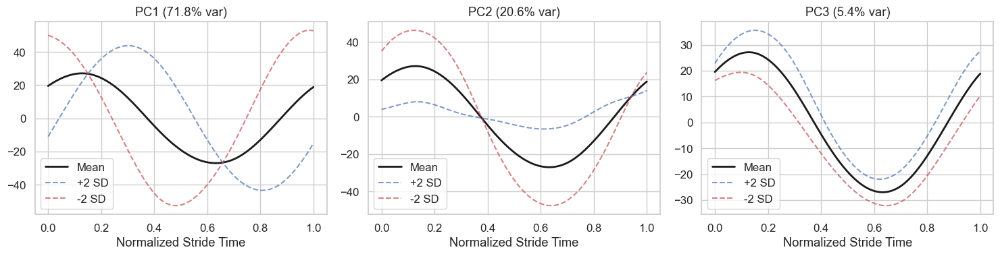


STATE SEQUENCE ANALYSIS

Found 16 state runs

Stable:
  Number of runs: 7
  Mean run length: 16.6 strides
  Max run length: 39 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 3
  Mean run length: 11.0 strides
  Max run length: 25 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 6
  Mean run length: 3.0 strides
  Max run length: 8 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 2/5
Quality Notes:
  • Poor FPCA reconstruction
  • Moderately separated states
  • Balanced state distribution

State Distribution: ['69.5%', '19.8%', '10.8%']
Dominant State: Stable


In [ ]:

def main():
    cwd = Path.cwd()
    marker_file = cwd.parent / ".." /"data"/"PBT"/"Young"/"Cereneo_SR_13"/"Pre.3" /"markers.nc"
    events_file = cwd.parent /  ".." /"data"/"PBT"/"Young"/"Cereneo_SR_13"/"Pre.4" /"events.nc"
    fs = 100.0

    # 1) Load
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.2, lp_cutoff=30.0,)
    
    # 2) Extract
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot strikes
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="Y13", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=10
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    msm.plot_all_feature_correlations()
    msm.plot_features_vs_clusters()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) stride based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))):  # Plot up to 20 strides
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])

    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary, summary_df

if __name__ == "__main__":
    model, metrics, df = main()
   


### 14

Found 205 foot strikes
Time range: 5.84s to 255.35s
Processing patient Y14 with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 204 valid strides
Average stride duration: 1.223s ± 0.025s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 0.2656, RMSE: 0.5154
Signal range: 54.3634, σ: 15.4439
NRMSE (range): 0.95%,  NRMSE (σ): 3.34%
Identifying stability states via K-means...
Clustering silhouette score: 0.217
Clustering quality: Poor clustering
Clustering silhouette score: 0.217
Clustering quality: Poor clustering
FPCA‑KMeans variance explained: 31.1%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for Y14:
  frac_state_0: 0.392
  frac_state_1: 0.343
  frac_state_2: 0.265
  mean_fpca_0_state_0: -1.026
  mean_fpca_1_state_0: 0.657
  mean_fpca_2_state_0: -0.063
  mean_fpca_0_state_1: 0.402
  mean_fpca_1_state_1: -0.793
  mean_fpca_2_state_1: -0.329
  mean_fpca_0_state_2: 0.999
  mean_fpca_1_sta

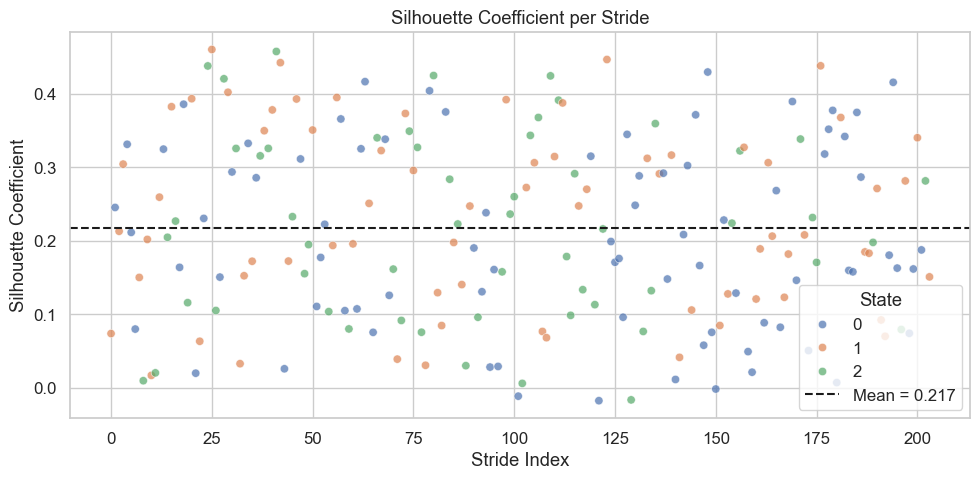

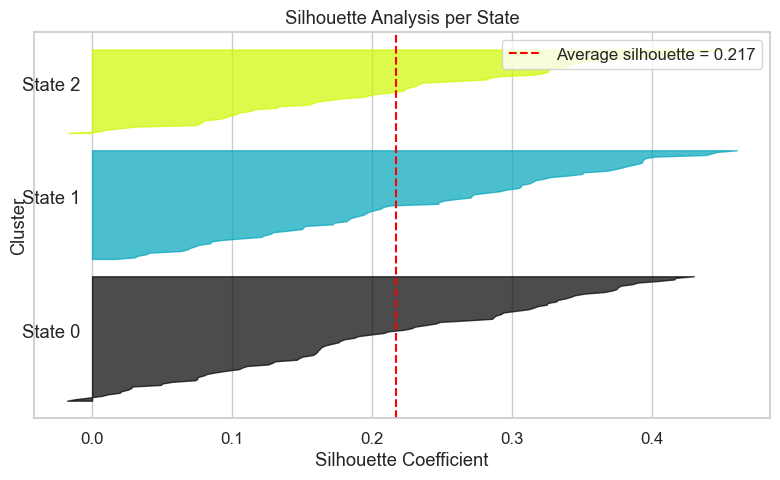


Visualizing stride alignment...


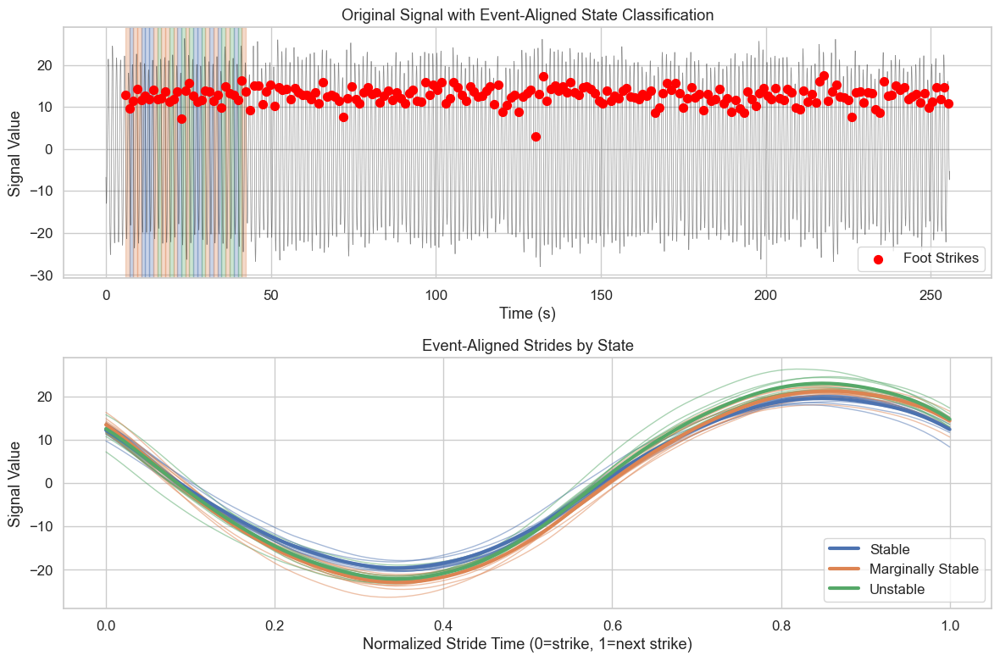

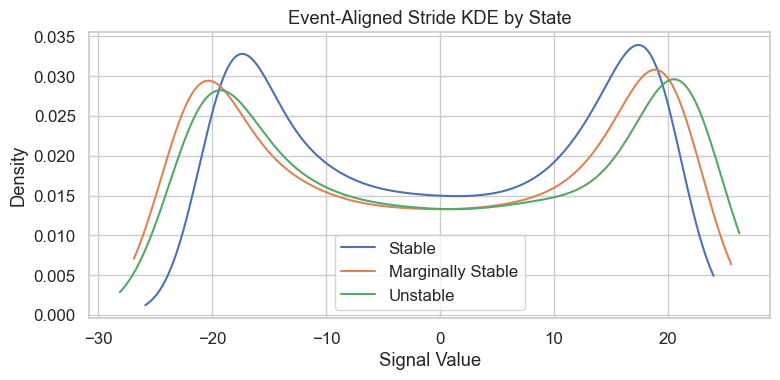

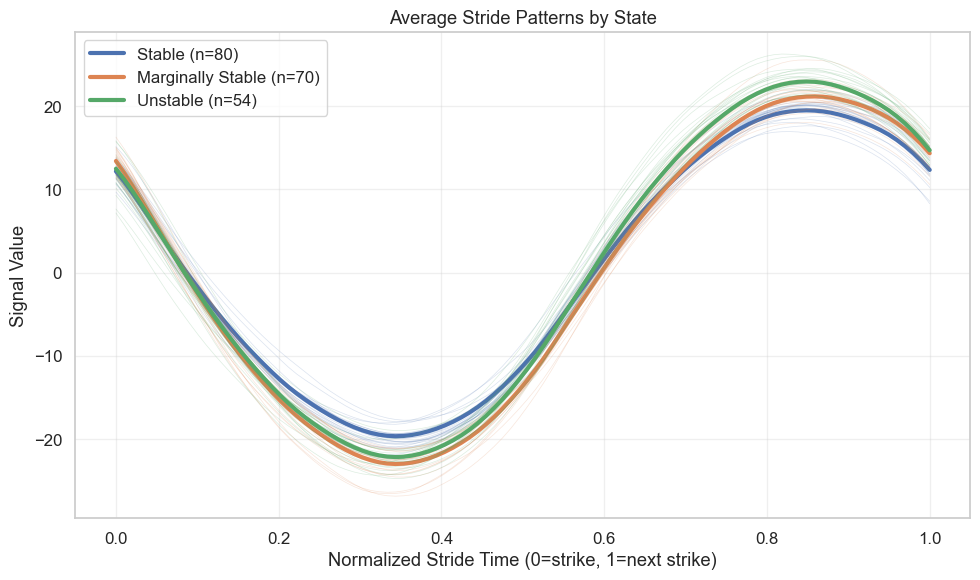

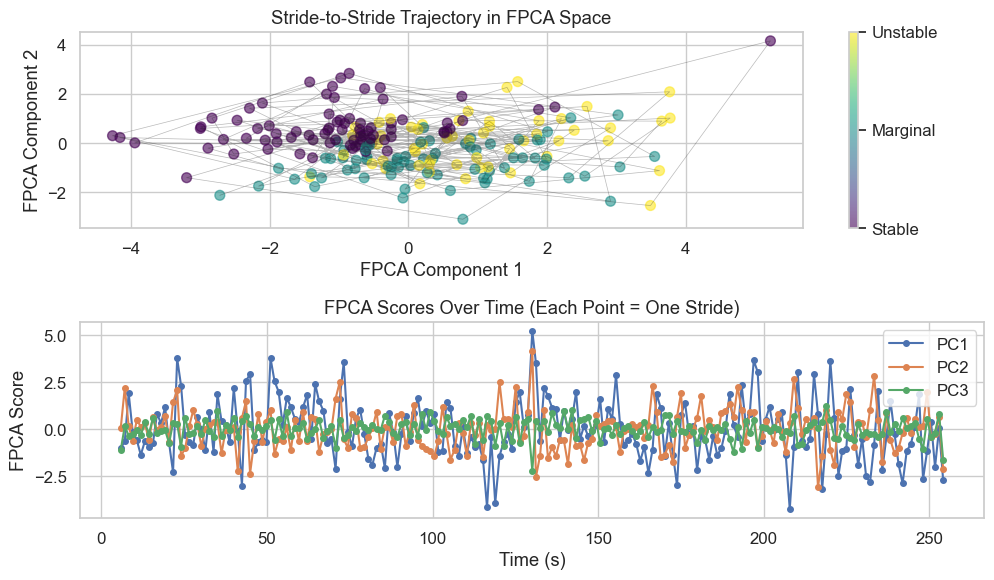

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\2282109575.py:157: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


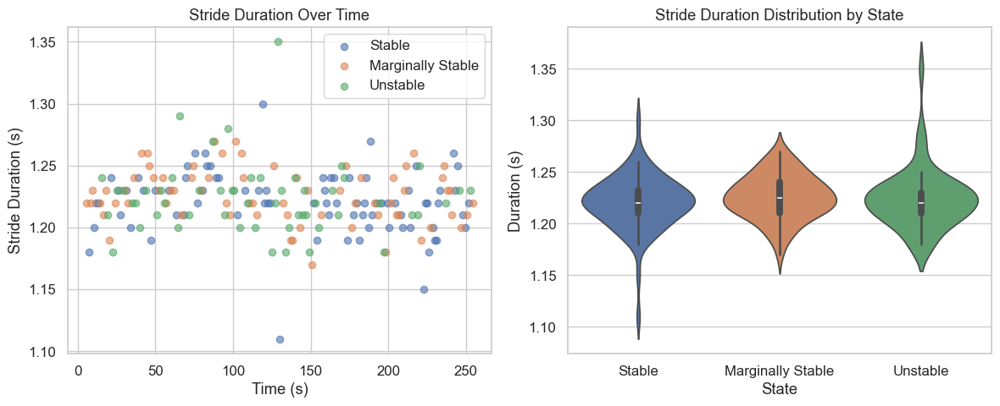

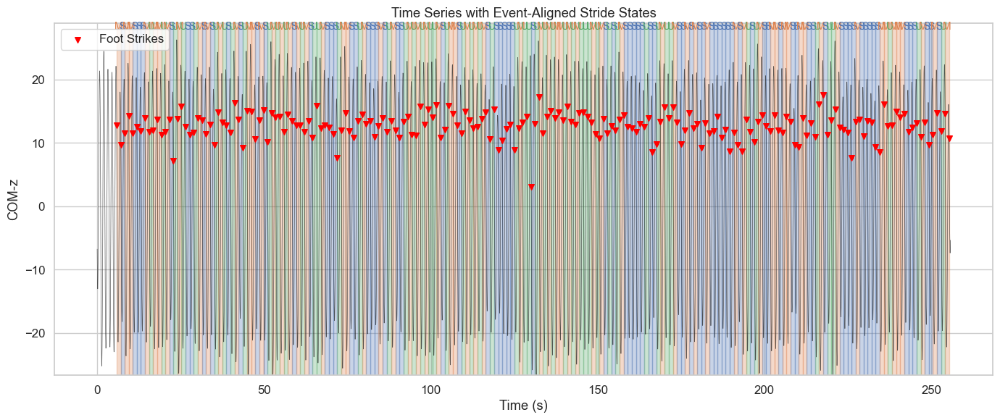


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 204
Average stride duration: 1.223 ± 0.025s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.217
  → Poor clustering - consider different parameters

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.475 0.212 0.312]
 [0.507 0.174 0.319]
 [0.13  0.741 0.13 ]]

Stationary Distribution Π:
[0.394 0.34  0.266]

Mean Dwell Times τ (strides):
[1.905 1.211 1.149]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.392
  Mean duration: 1.220s
  Duration std: 0.026s
  Mean PC1: -1.026
  Mean PC2: 0.657
  Mean PC3: -0.063

Marginally Stable:
  Fraction of strides: 0.343
  Mean duration: 1.226s
  Duration std: 0.021s
  Mean PC1: 0.402
  Mean PC2: -0.793
  Mean PC3: -0.329

Unstable:
  Fraction of strides: 0.265
  Mean duration: 1.224s
  Duration std: 0.029s
  Mean PC1: 0.999
  Mean PC2: 0.055
  Mean PC3: 0.520

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 60.3% (cumulative

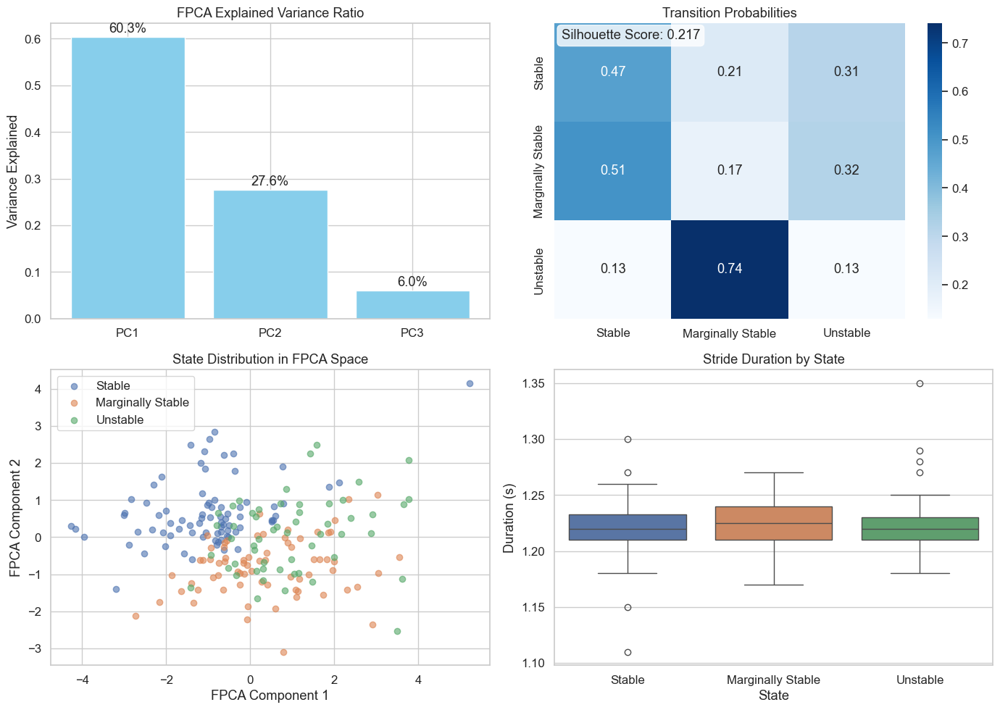

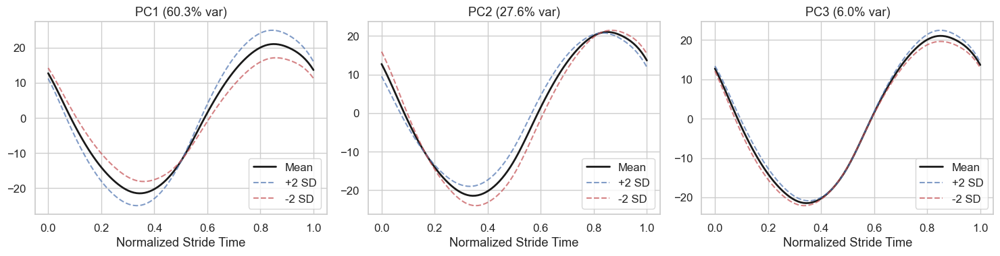


STATE SEQUENCE ANALYSIS

Found 147 state runs

Stable:
  Number of runs: 42
  Mean run length: 1.9 strides
  Max run length: 6 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 58
  Mean run length: 1.2 strides
  Max run length: 3 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 47
  Mean run length: 1.1 strides
  Max run length: 3 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 1/5
Quality Notes:
  • Poor FPCA reconstruction
  • Poorly separated states
  • Balanced state distribution

State Distribution: ['39.2%', '34.3%', '26.5%']
Dominant State: Stable


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal



def main():
  
    marker_file = cwd.parent / ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.3" /"markers.nc"
    events_file = cwd.parent /  ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.4" /"events.nc"
   
    fs = 100.0

    # 1) Load 
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.5, lp_cutoff=25.0)
    
    # 2) Extract foot strike events
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot strikes
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="Y14", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=15
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) - now truly stride-based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))): 
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])

    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    # if 'fpca_reconstruction_mse' in msm.validation_metrics:
    #     mse = msm.validation_metrics['fpca_reconstruction_mse']
    #     print(f"FPCA Reconstruction MSE: {mse:.4f}")
    #     if mse < 0.01:
    #         print("  → Excellent FPCA reconstruction quality")
    #     elif mse < 0.1:
    #         print("  → Good FPCA reconstruction quality")
    #     else:
    #         print("  → Poor FPCA reconstruction quality - consider more PCs")
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary, summary_df

if __name__ == "__main__":
    model, metrics , df = main()
   


In [96]:
df.to_excel(cwd.parent /".."/"results"/"tocopy.xlsx", index=False)

# Model Fit - CGA

### 4 - PWS

Found 57 foot strikes
Time range: 5.82s to 69.33s
Processing patient CGA_4_PWS with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 56 valid strides
Average stride duration: 1.134s ± 0.022s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 0.3705, RMSE: 0.6087
Signal range: 86.0765, σ: 15.1976
NRMSE (range): 0.71%,  NRMSE (σ): 4.01%
Identifying stability states via K-means...
Clustering silhouette score: 0.236
Clustering quality: Poor clustering
Clustering silhouette score: 0.236
Clustering quality: Poor clustering
FPCA‑KMeans variance explained: 57.3%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for CGA_4_PWS:
  frac_state_0: 0.429
  frac_state_1: 0.286
  frac_state_2: 0.286
  mean_fpca_0_state_0: -5.800
  mean_fpca_1_state_0: -1.708
  mean_fpca_2_state_0: -0.314
  mean_fpca_0_state_1: -0.757
  mean_fpca_1_state_1: 4.131
  mean_fpca_2_state_1: 0.530
  mean_fpca_0_state_2: 9.458
  mean_f

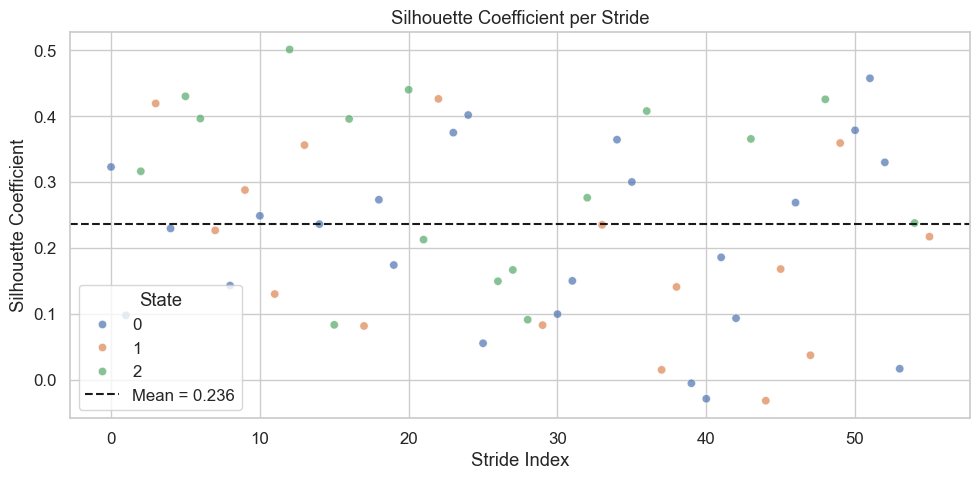

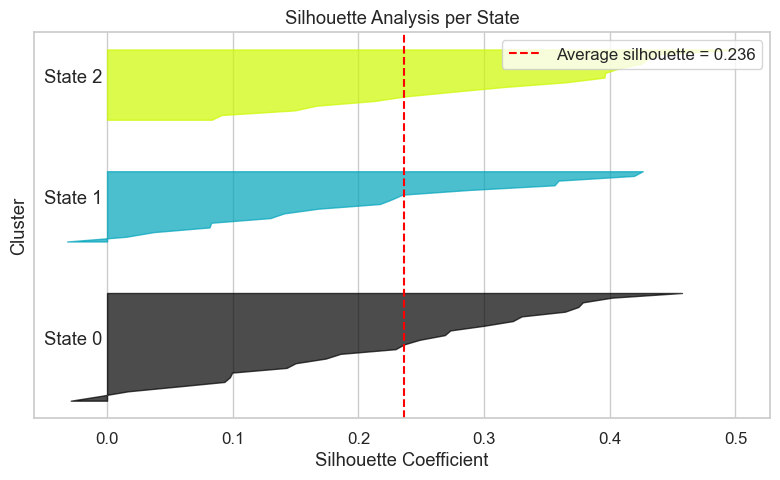


Visualizing stride alignment...


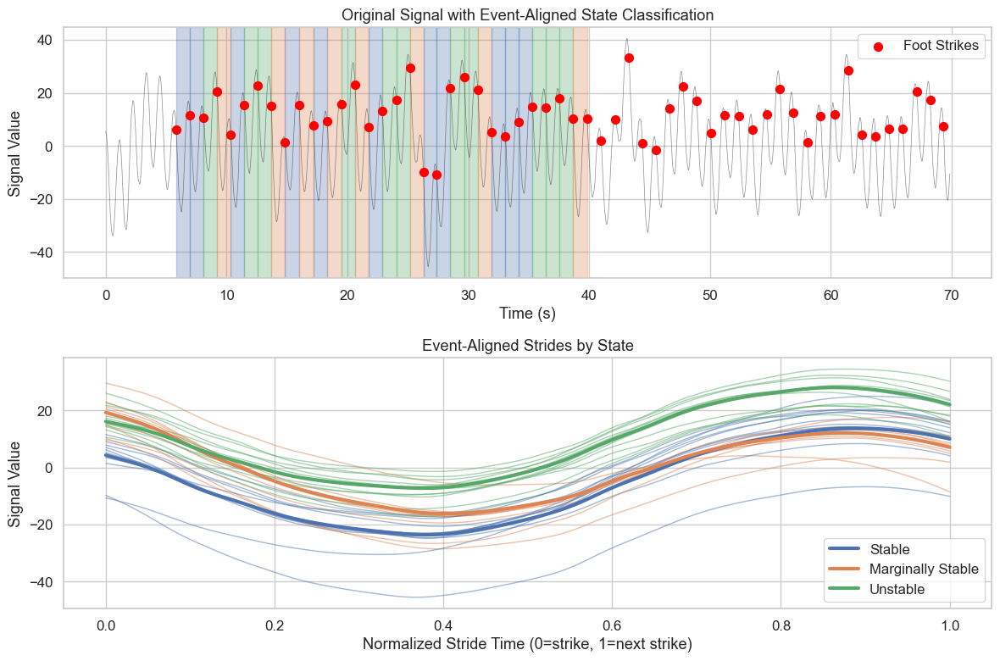

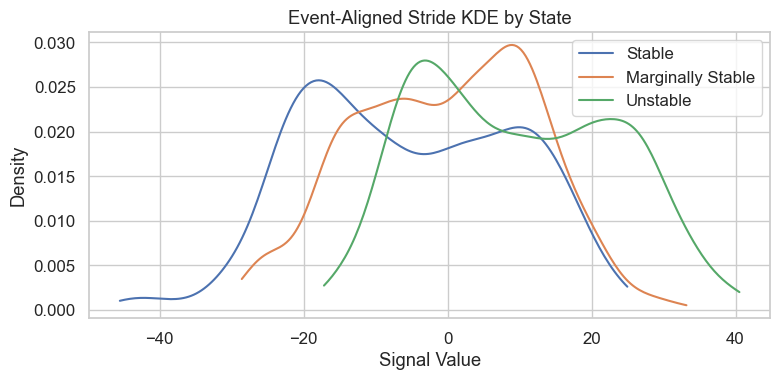

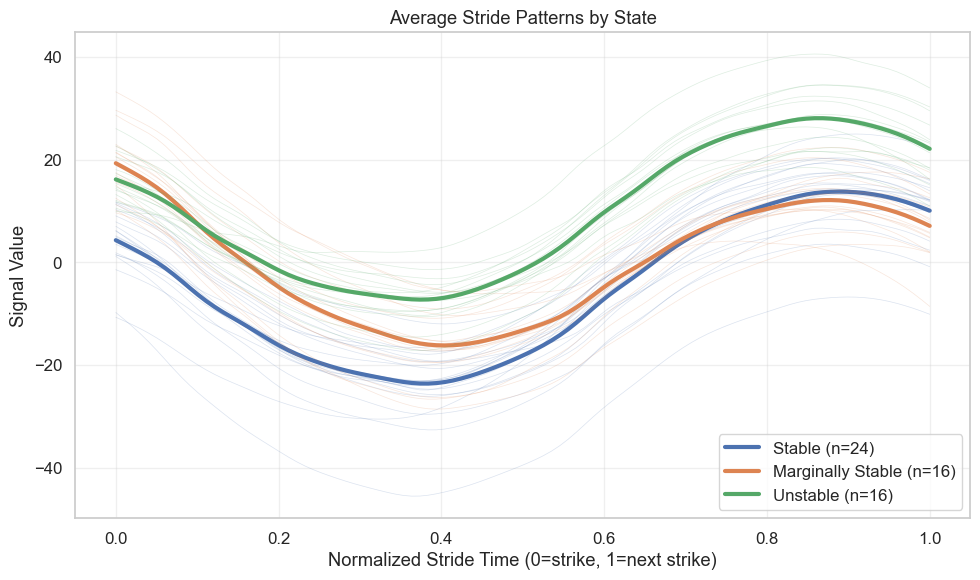

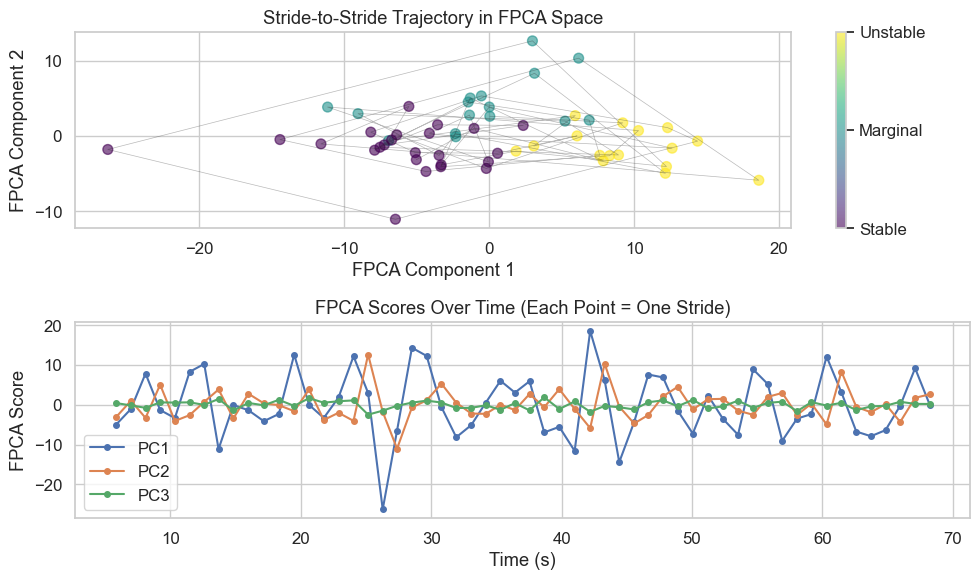

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\2223374880.py:155: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


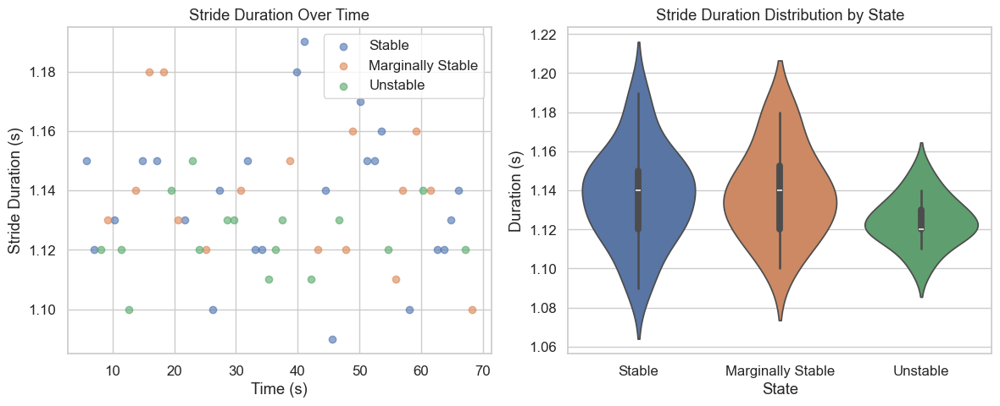

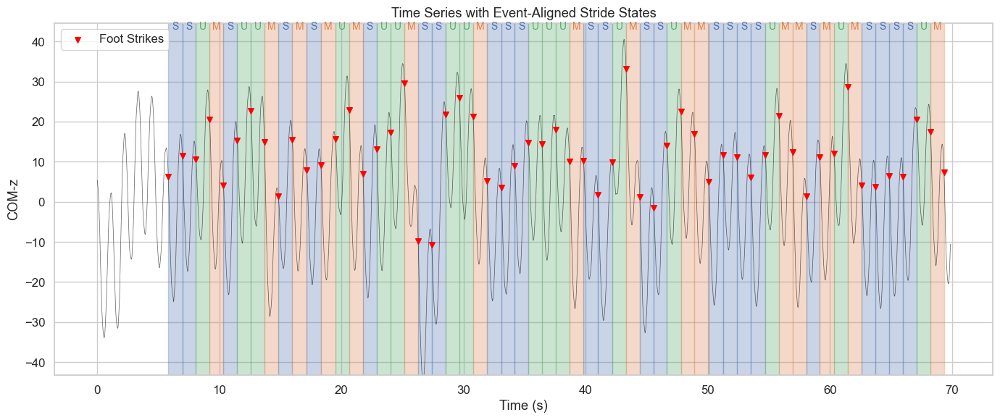


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 56
Average stride duration: 1.134 ± 0.022s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.236
  → Poor clustering - consider different parameters

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.5   0.125 0.375]
 [0.733 0.133 0.133]
 [0.    0.688 0.312]]

Stationary Distribution Π:
[0.424 0.289 0.287]

Mean Dwell Times τ (strides):
[2.    1.154 1.455]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.429
  Mean duration: 1.137s
  Duration std: 0.025s
  Mean PC1: -5.800
  Mean PC2: -1.708
  Mean PC3: -0.314

Marginally Stable:
  Fraction of strides: 0.286
  Mean duration: 1.139s
  Duration std: 0.023s
  Mean PC1: -0.757
  Mean PC2: 4.131
  Mean PC3: 0.530

Unstable:
  Fraction of strides: 0.286
  Mean duration: 1.124s
  Duration std: 0.013s
  Mean PC1: 9.458
  Mean PC2: -1.569
  Mean PC3: -0.059

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 79.8% (cumulativ

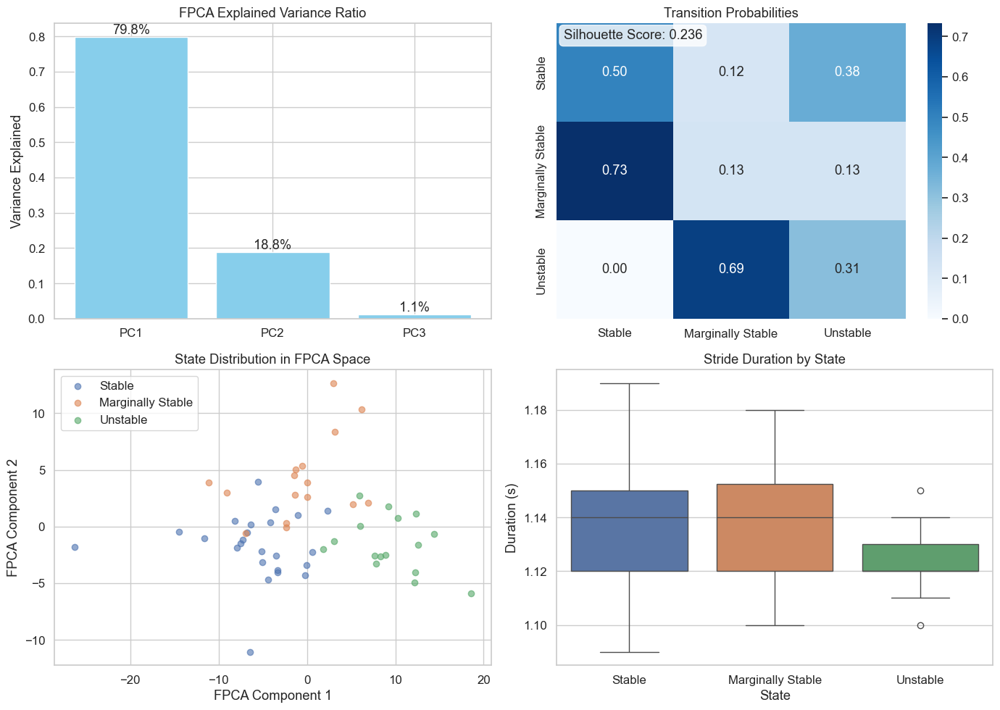

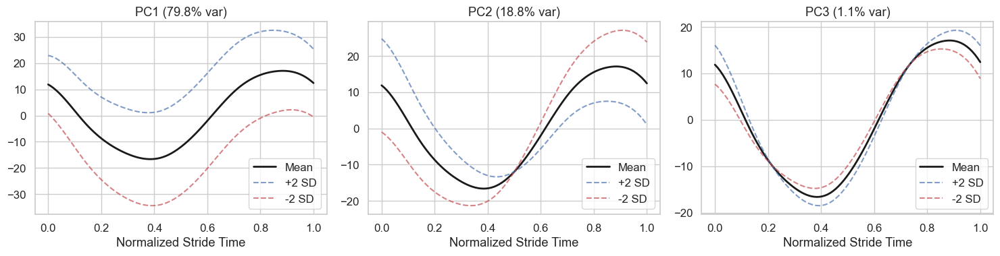


STATE SEQUENCE ANALYSIS

Found 37 state runs

Stable:
  Number of runs: 12
  Mean run length: 2.0 strides
  Max run length: 4 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 14
  Mean run length: 1.1 strides
  Max run length: 2 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 11
  Mean run length: 1.5 strides
  Max run length: 3 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 1/5
Quality Notes:
  • Poor FPCA reconstruction
  • Poorly separated states
  • Balanced state distribution

State Distribution: ['42.9%', '28.6%', '28.6%']
Dominant State: Stable


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal

def main():
    cwd = Path.cwd()
    # marker_file = cwd.parent / ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.3" /"markers.nc"
    # events_file = cwd.parent /  ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.4" /"events.nc"
    marker_file = cwd.parent / ".." / "data" / "CGA" / "04" / "PWS" / "4"/ "markers.nc"
    events_file = cwd.parent / ".." / "data" / "CGA" / "04" / "PWS" / "4"/ "events.nc"
    fs = 100.0

    # 1) Load & preprocess COM-z
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.1, lp_cutoff=15.0)
    
    # 2) Extract foot strike events
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot strikes 
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="CGA_4_PWS", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=10
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) - now truly stride-based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))): 
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])
    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    # if 'fpca_reconstruction_mse' in msm.validation_metrics:
    #     mse = msm.validation_metrics['fpca_reconstruction_mse']
    #     print(f"FPCA Reconstruction MSE: {mse:.4f}")
    #     if mse < 0.01:
    #         print("  → Excellent FPCA reconstruction quality")
    #     elif mse < 0.1:
    #         print("  → Good FPCA reconstruction quality")
    #     else:
    #         print("  → Poor FPCA reconstruction quality - consider more PCs")
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary,summary_df

if __name__ == "__main__":
    model, metrics, df = main()
   


In [99]:
df.to_excel(cwd.parent /".."/"results"/"tocopy.xlsx", index=False)

### 4 - SWS

Found 55 foot strikes
Time range: 6.12s to 84.35s
Processing patient CGA_4_SWS with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 54 valid strides
Average stride duration: 1.449s ± 0.093s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 0.4959, RMSE: 0.7042
Signal range: 86.3036, σ: 20.4316
NRMSE (range): 0.82%,  NRMSE (σ): 3.45%
Identifying stability states via K-means...
Clustering silhouette score: 0.274
Clustering quality: Weak clustering
Clustering silhouette score: 0.274
Clustering quality: Weak clustering
FPCA‑KMeans variance explained: 59.4%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for CGA_4_SWS:
  frac_state_0: 0.389
  frac_state_1: 0.352
  frac_state_2: 0.259
  mean_fpca_0_state_0: 6.017
  mean_fpca_1_state_0: -0.340
  mean_fpca_2_state_0: -0.371
  mean_fpca_0_state_1: -4.969
  mean_fpca_1_state_1: -2.988
  mean_fpca_2_state_1: 0.268
  mean_fpca_0_state_2: -2.281
  mean_

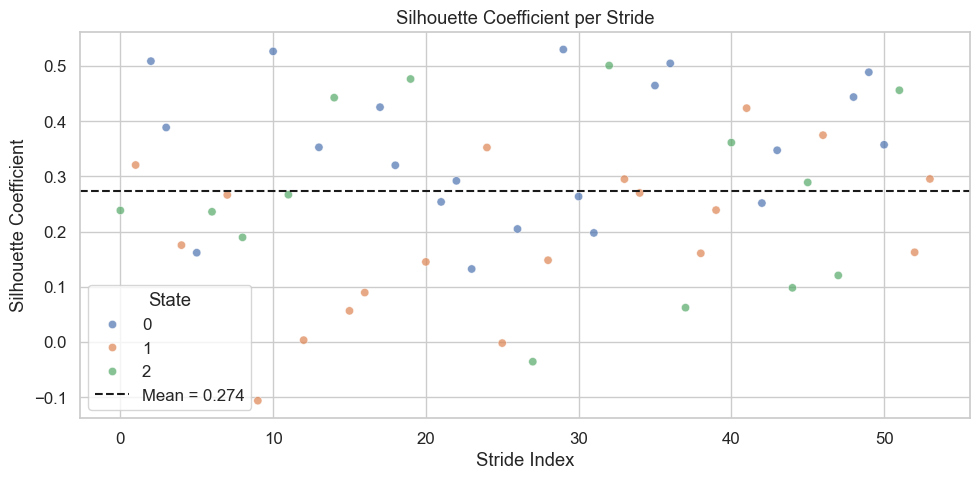

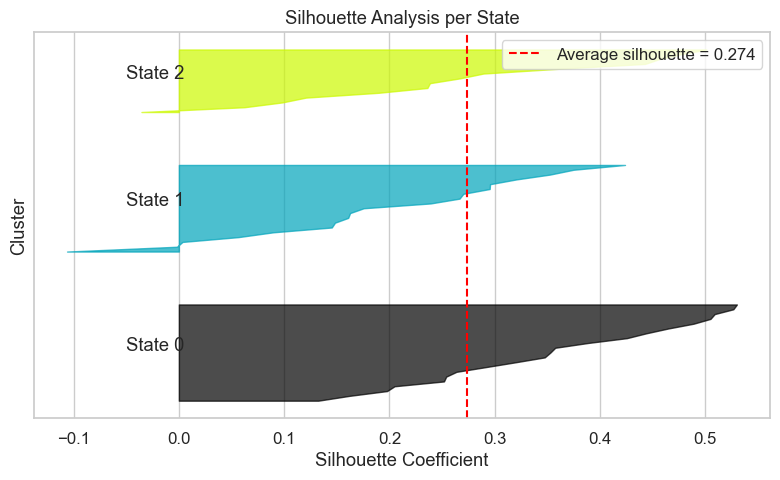


Visualizing stride alignment...


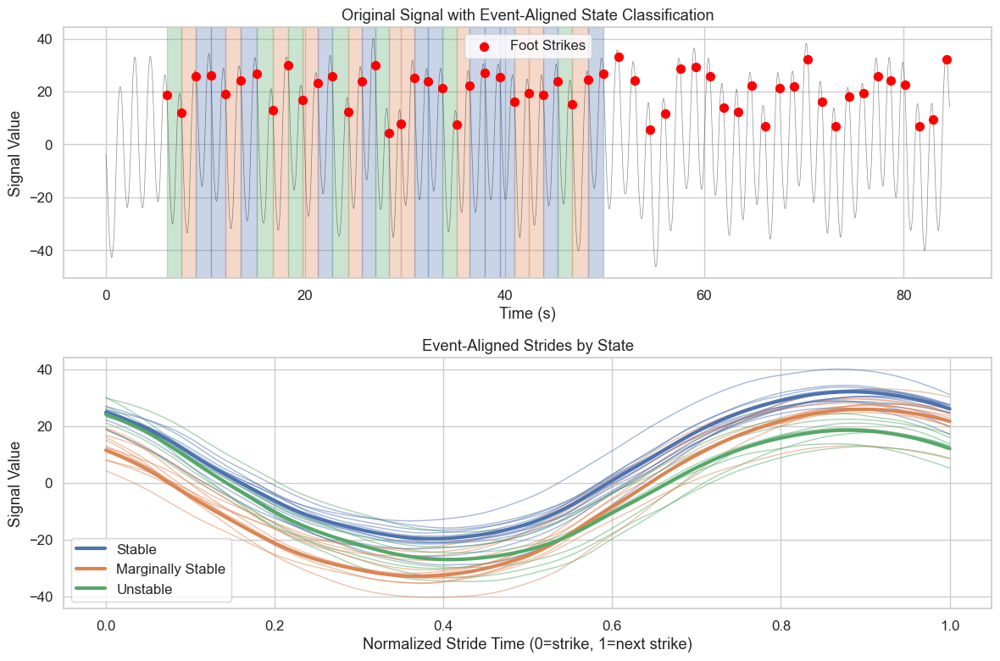

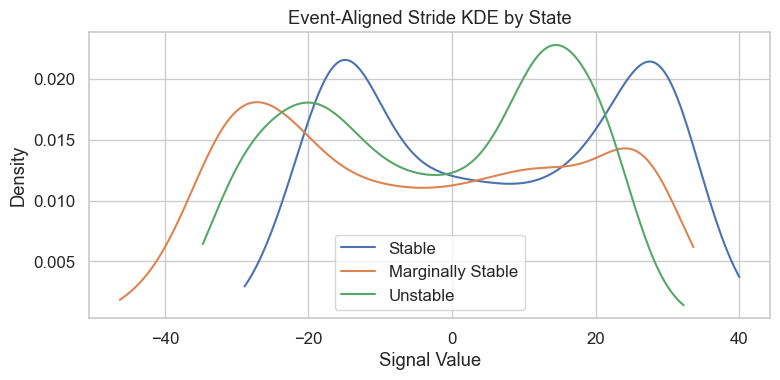

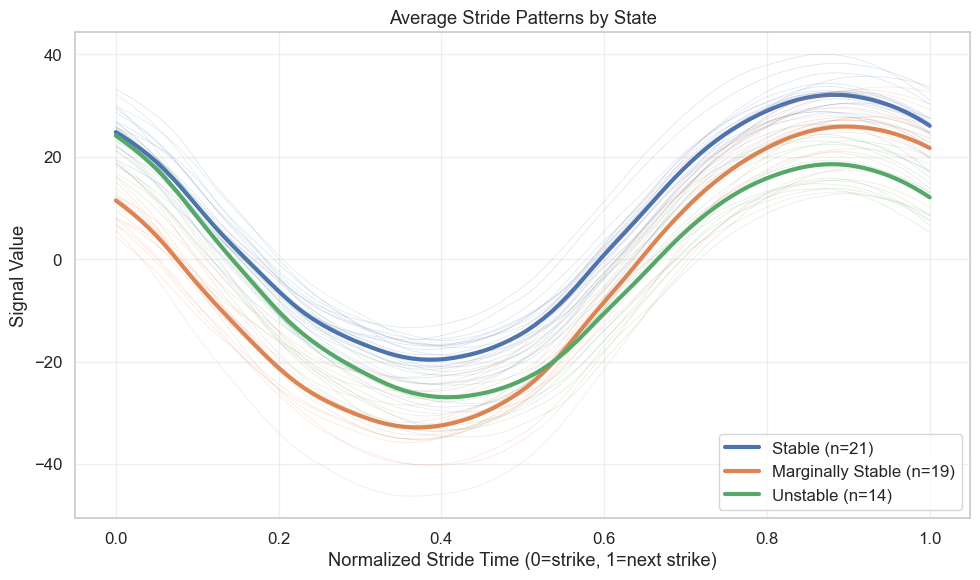

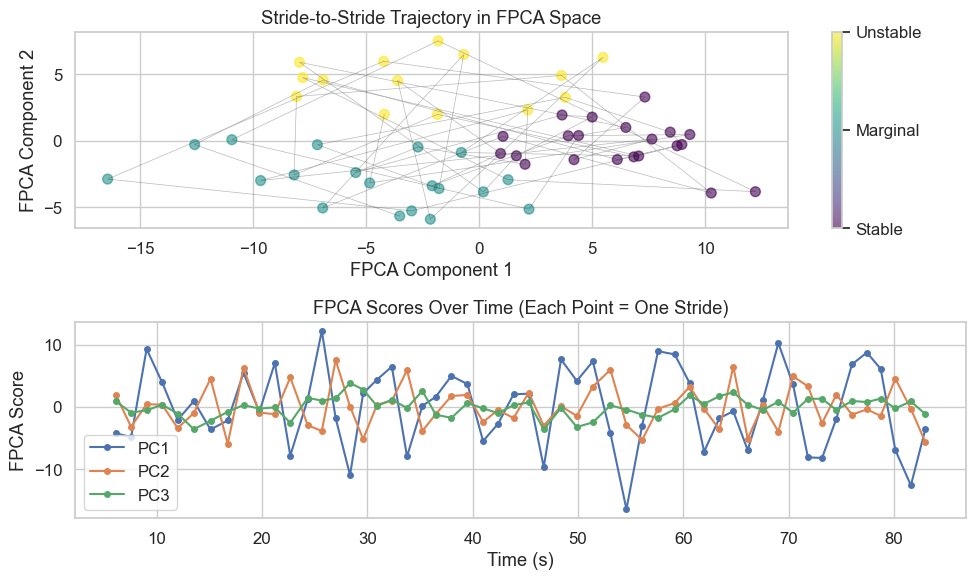

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\2659510747.py:155: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


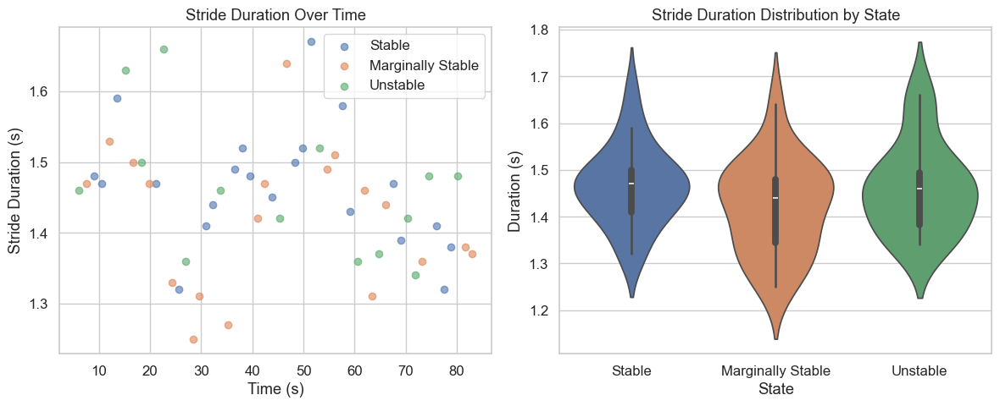

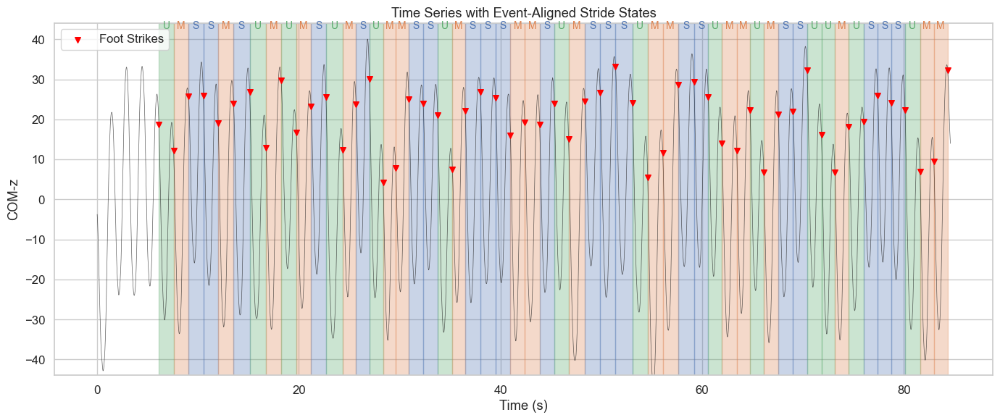


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 54
Average stride duration: 1.449 ± 0.094s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.274
  → Weak clustering - states may overlap

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.476 0.095 0.429]
 [0.556 0.278 0.167]
 [0.071 0.857 0.071]]

Stationary Distribution Π:
[0.403 0.348 0.249]

Mean Dwell Times τ (strides):
[1.909 1.385 1.077]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.389
  Mean duration: 1.466s
  Duration std: 0.084s
  Mean PC1: 6.017
  Mean PC2: -0.340
  Mean PC3: -0.371

Marginally Stable:
  Fraction of strides: 0.352
  Mean duration: 1.420s
  Duration std: 0.100s
  Mean PC1: -4.969
  Mean PC2: -2.988
  Mean PC3: 0.268

Unstable:
  Fraction of strides: 0.259
  Mean duration: 1.461s
  Duration std: 0.096s
  Mean PC1: -2.281
  Mean PC2: 4.564
  Mean PC3: 0.193

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 73.9% (cumulative: 73.9%)
PC

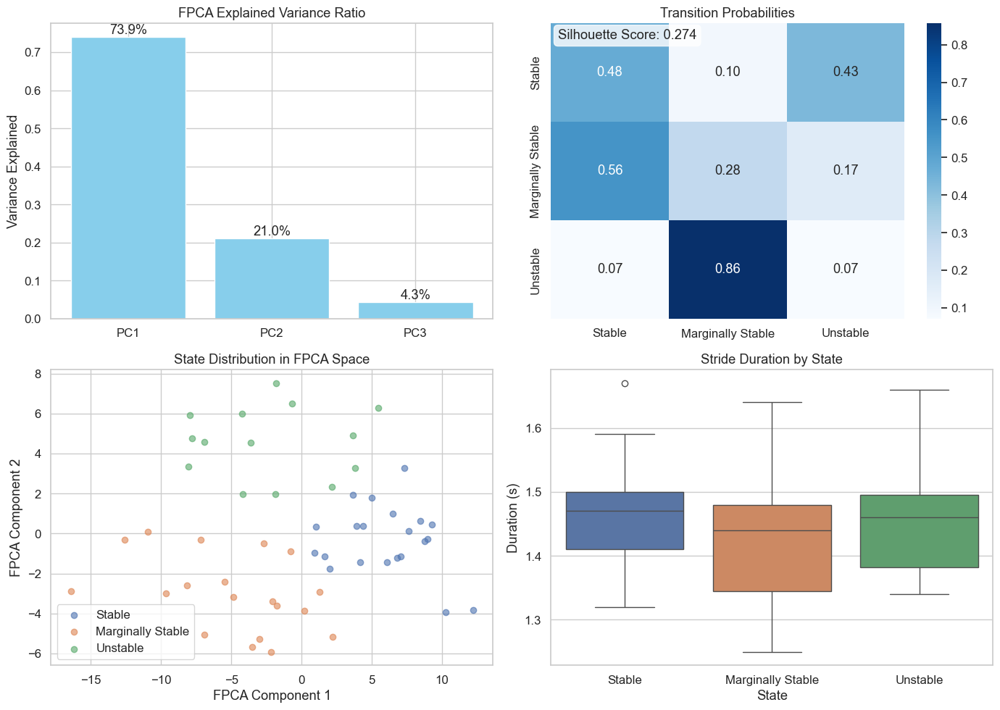

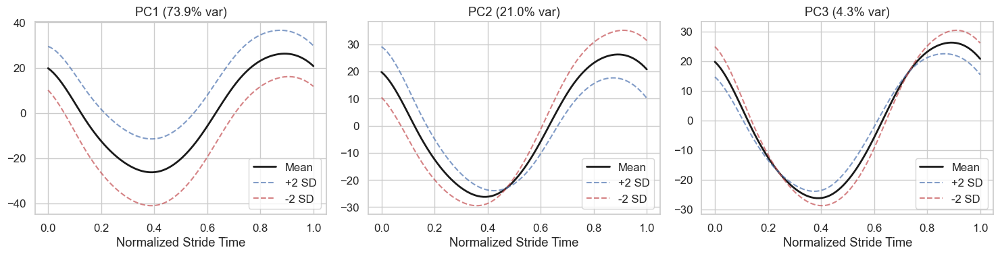


STATE SEQUENCE ANALYSIS

Found 38 state runs

Stable:
  Number of runs: 11
  Mean run length: 1.9 strides
  Max run length: 3 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 14
  Mean run length: 1.4 strides
  Max run length: 2 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 13
  Mean run length: 1.1 strides
  Max run length: 2 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 2/5
Quality Notes:
  • Poor FPCA reconstruction
  • Moderately separated states
  • Balanced state distribution

State Distribution: ['38.9%', '35.2%', '25.9%']
Dominant State: Stable


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal

def main():
    cwd = Path.cwd()
    # marker_file = cwd.parent / ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.3" /"markers.nc"
    # events_file = cwd.parent /  ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.4" /"events.nc"
    marker_file = cwd.parent / ".." / "data" / "CGA" / "04" / "SWS" / "4"/ "markers.nc"
    events_file = cwd.parent / ".." / "data" / "CGA" / "04" / "SWS" / "4"/ "events.nc"
    fs = 100.0

    # 1) Load & preprocess COM-z
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.1, lp_cutoff=15.0)
    
    # 2) Extract foot strike events
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot strikes 
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="CGA_4_SWS", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=10
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) - now truly stride-based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))): 
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])
    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    # if 'fpca_reconstruction_mse' in msm.validation_metrics:
    #     mse = msm.validation_metrics['fpca_reconstruction_mse']
    #     print(f"FPCA Reconstruction MSE: {mse:.4f}")
    #     if mse < 0.01:
    #         print("  → Excellent FPCA reconstruction quality")
    #     elif mse < 0.1:
    #         print("  → Good FPCA reconstruction quality")
    #     else:
    #         print("  → Poor FPCA reconstruction quality - consider more PCs")
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary,summary_df

if __name__ == "__main__":
    model, metrics,df = main()
   


In [101]:
df.to_excel(cwd.parent /".."/"results"/"tocopy.xlsx", index=False)

### 38 - PWS

Found 95 foot strikes
Time range: 6.10s to 134.22s
Processing patient CGA_38_PWS with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 94 valid strides
Average stride duration: 1.363s ± 0.046s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 0.9637, RMSE: 0.9817
Signal range: 100.6609, σ: 20.7960
NRMSE (range): 0.98%,  NRMSE (σ): 4.72%
Identifying stability states via K-means...
Clustering silhouette score: 0.253
Clustering quality: Weak clustering
Clustering silhouette score: 0.253
Clustering quality: Weak clustering
FPCA‑KMeans variance explained: 59.5%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for CGA_38_PWS:
  frac_state_0: 0.426
  frac_state_1: 0.309
  frac_state_2: 0.266
  mean_fpca_0_state_0: 7.917
  mean_fpca_1_state_0: -0.552
  mean_fpca_2_state_0: 0.261
  mean_fpca_0_state_1: -7.596
  mean_fpca_1_state_1: -3.941
  mean_fpca_2_state_1: 0.176
  mean_fpca_0_state_2: -3.857
  me

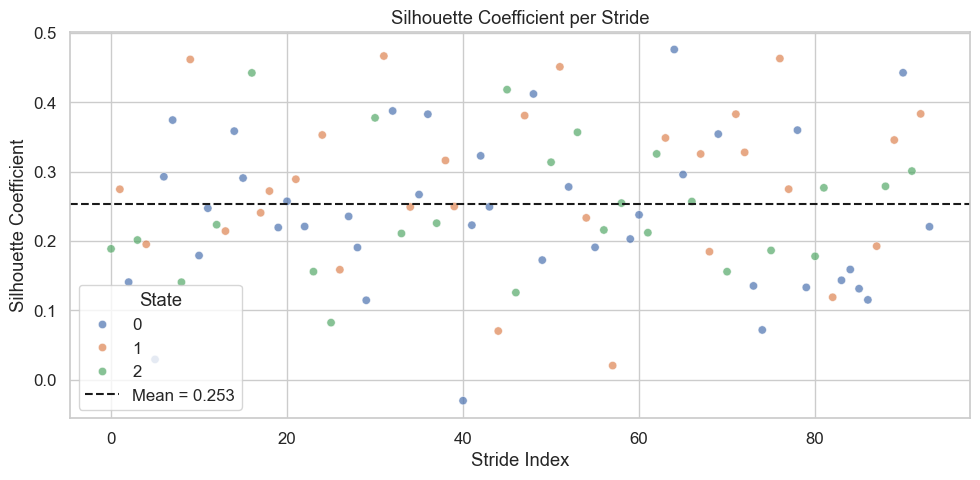

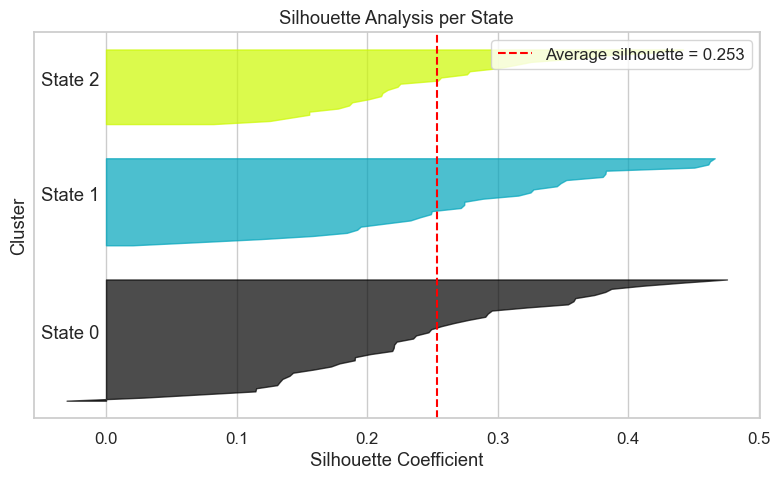


Visualizing stride alignment...


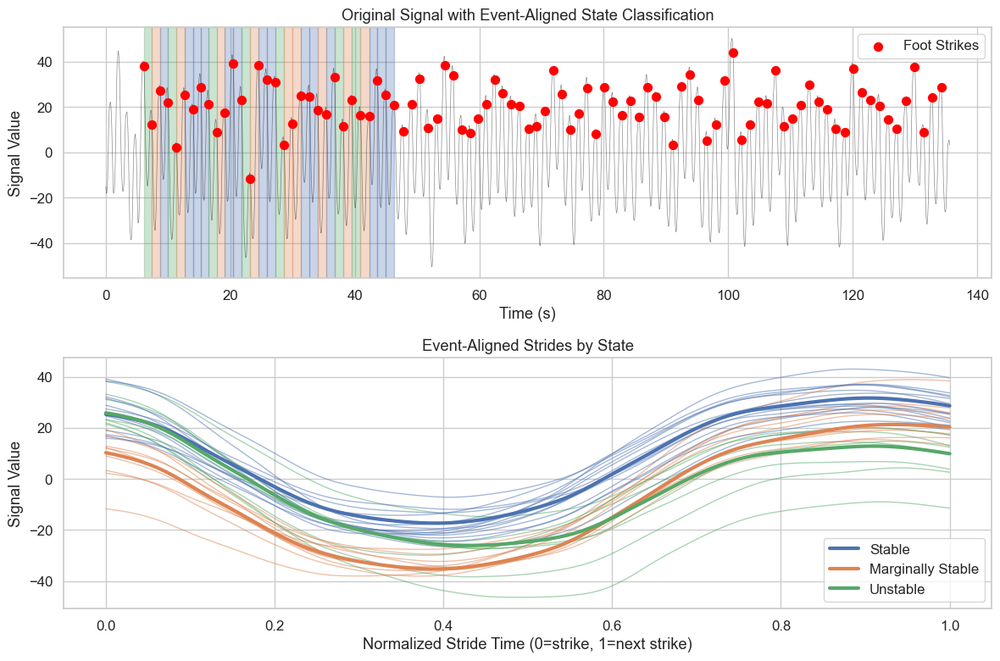

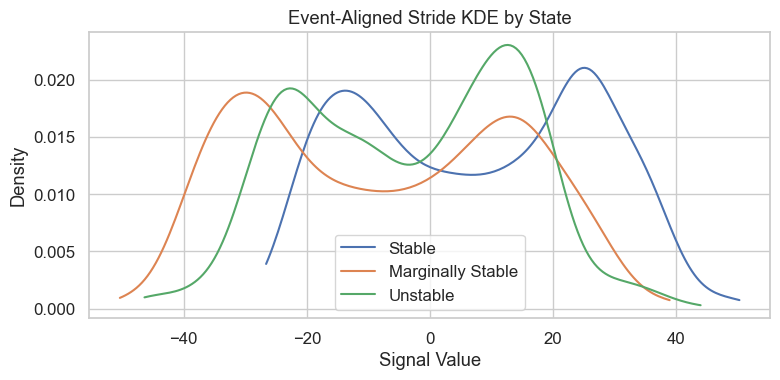

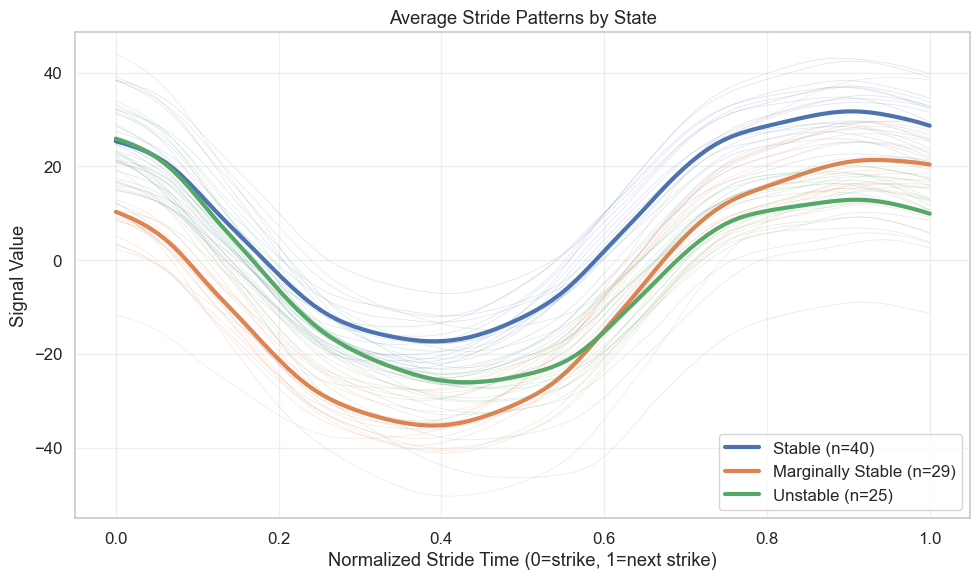

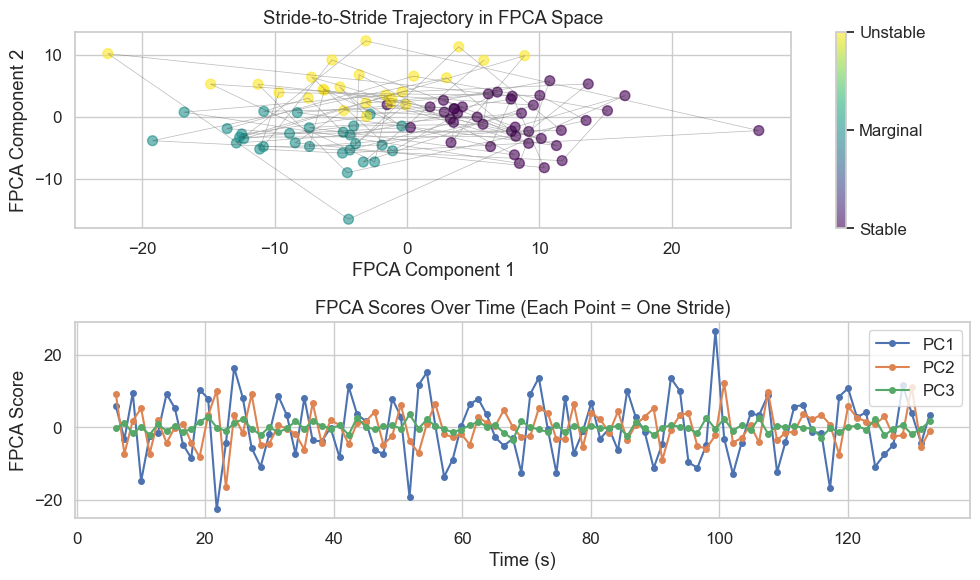

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\973366297.py:155: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


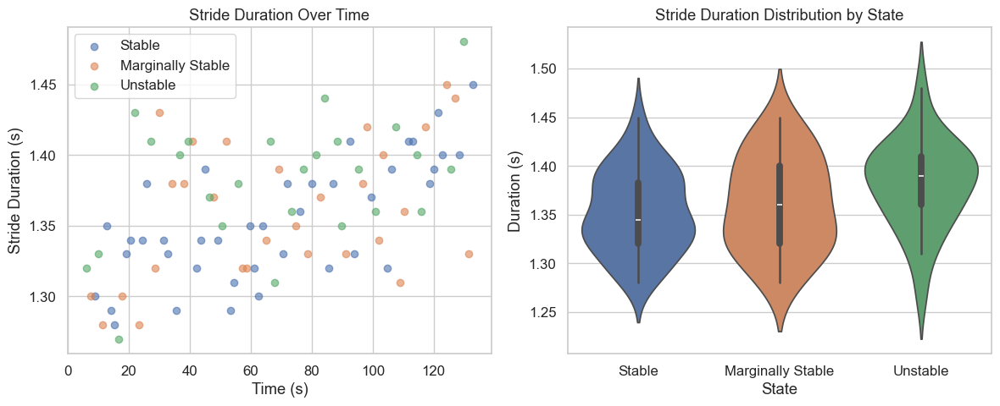

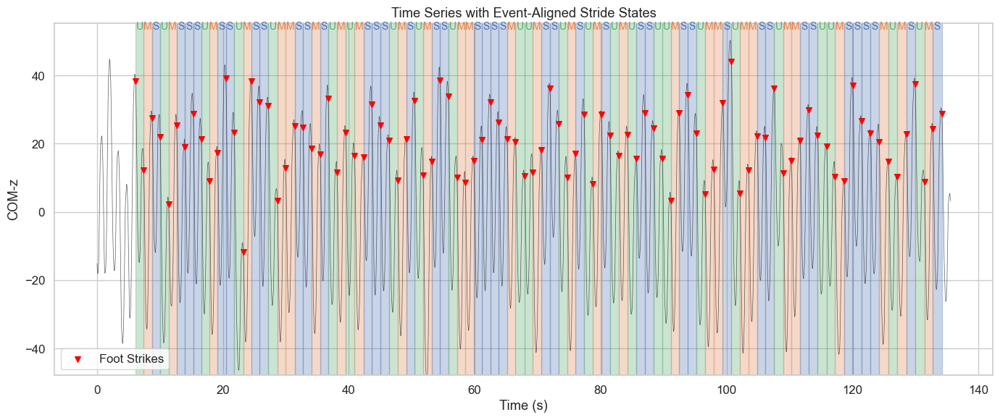


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 94
Average stride duration: 1.363 ± 0.046s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.253
  → Weak clustering - states may overlap

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.487 0.077 0.436]
 [0.69  0.172 0.138]
 [0.04  0.84  0.12 ]]

Stationary Distribution Π:
[0.432 0.306 0.262]

Mean Dwell Times τ (strides):
[1.95  1.208 1.136]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.426
  Mean duration: 1.353s
  Duration std: 0.042s
  Mean PC1: 7.917
  Mean PC2: -0.552
  Mean PC3: 0.261

Marginally Stable:
  Fraction of strides: 0.309
  Mean duration: 1.361s
  Duration std: 0.049s
  Mean PC1: -7.596
  Mean PC2: -3.941
  Mean PC3: 0.176

Unstable:
  Fraction of strides: 0.266
  Mean duration: 1.382s
  Duration std: 0.045s
  Mean PC1: -3.857
  Mean PC2: 5.454
  Mean PC3: -0.622

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 74.1% (cumulative: 74.1%)
PC

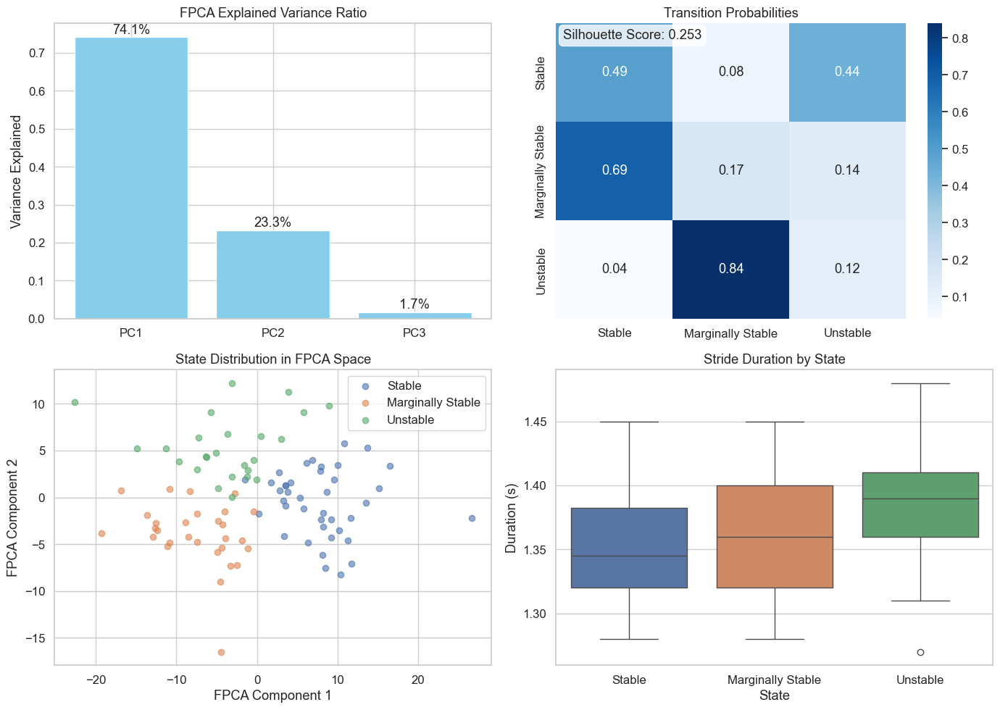

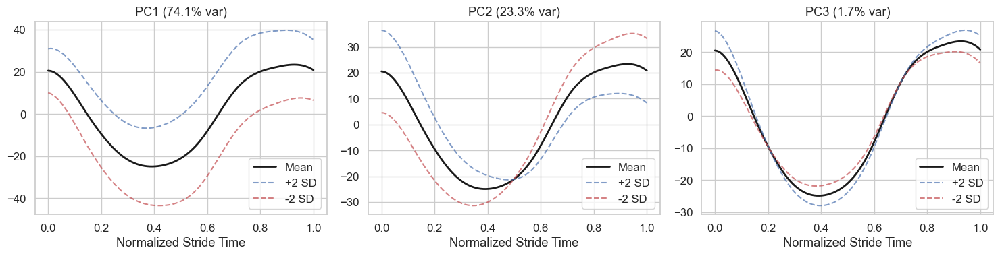


STATE SEQUENCE ANALYSIS

Found 67 state runs

Stable:
  Number of runs: 21
  Mean run length: 1.9 strides
  Max run length: 4 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 24
  Mean run length: 1.2 strides
  Max run length: 2 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 22
  Mean run length: 1.1 strides
  Max run length: 2 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 2/5
Quality Notes:
  • Poor FPCA reconstruction
  • Moderately separated states
  • Balanced state distribution

State Distribution: ['42.6%', '30.9%', '26.6%']
Dominant State: Stable


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal

def main():
    cwd = Path.cwd()
    # marker_file = cwd.parent / ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.3" /"markers.nc"
    # events_file = cwd.parent /  ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.4" /"events.nc"
    marker_file = cwd.parent / ".." / "data" / "CGA" / "38" / "PWS" / "4"/ "markers.nc"
    events_file = cwd.parent / ".." / "data" / "CGA" / "38" / "PWS" / "4"/ "events.nc"
    fs = 100.0

    # 1) Load & preprocess COM-z
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.1, lp_cutoff=15.0)
    
    # 2) Extract foot strike events
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot strikes 
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="CGA_38_PWS", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=10
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) - now truly stride-based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))): 
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])
    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    # if 'fpca_reconstruction_mse' in msm.validation_metrics:
    #     mse = msm.validation_metrics['fpca_reconstruction_mse']
    #     print(f"FPCA Reconstruction MSE: {mse:.4f}")
    #     if mse < 0.01:
    #         print("  → Excellent FPCA reconstruction quality")
    #     elif mse < 0.1:
    #         print("  → Good FPCA reconstruction quality")
    #     else:
    #         print("  → Poor FPCA reconstruction quality - consider more PCs")
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary,summary_df

if __name__ == "__main__":
    model, metrics,df = main()
   


In [103]:
df.to_excel(cwd.parent /".."/"results"/"tocopy.xlsx", index=False)

### 38 - FWS

Found 95 foot strikes
Time range: 5.15s to 121.68s
Processing patient CGA_38_FWS with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 94 valid strides
Average stride duration: 1.240s ± 0.025s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 0.6650, RMSE: 0.8155
Signal range: 112.8150, σ: 21.4483
NRMSE (range): 0.72%,  NRMSE (σ): 3.80%
Identifying stability states via K-means...
Clustering silhouette score: 0.214
Clustering quality: Poor clustering
Clustering silhouette score: 0.214
Clustering quality: Poor clustering
FPCA‑KMeans variance explained: 23.3%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for CGA_38_FWS:
  frac_state_0: 0.404
  frac_state_1: 0.309
  frac_state_2: 0.287
  mean_fpca_0_state_0: -4.399
  mean_fpca_1_state_0: 4.638
  mean_fpca_2_state_0: 0.775
  mean_fpca_0_state_1: -2.884
  mean_fpca_1_state_1: 0.183
  mean_fpca_2_state_1: -1.476
  mean_fpca_0_state_2: 9.288
  mea

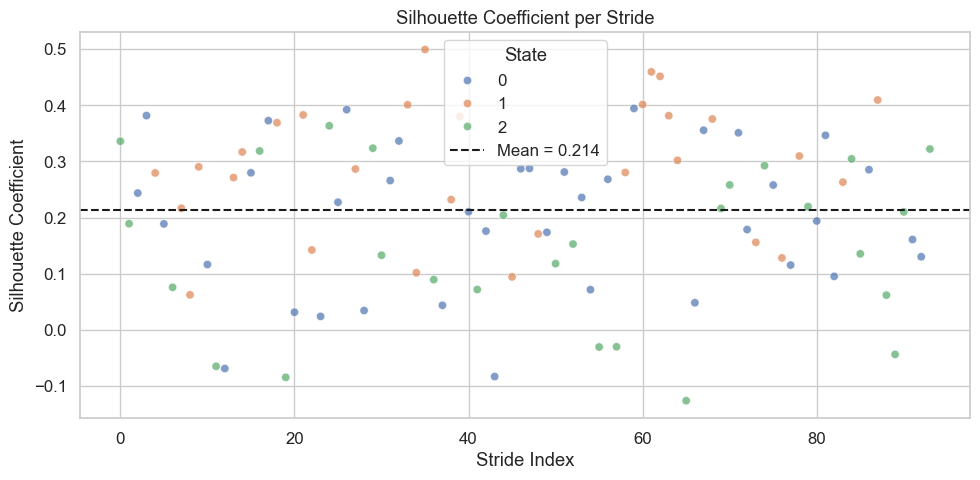

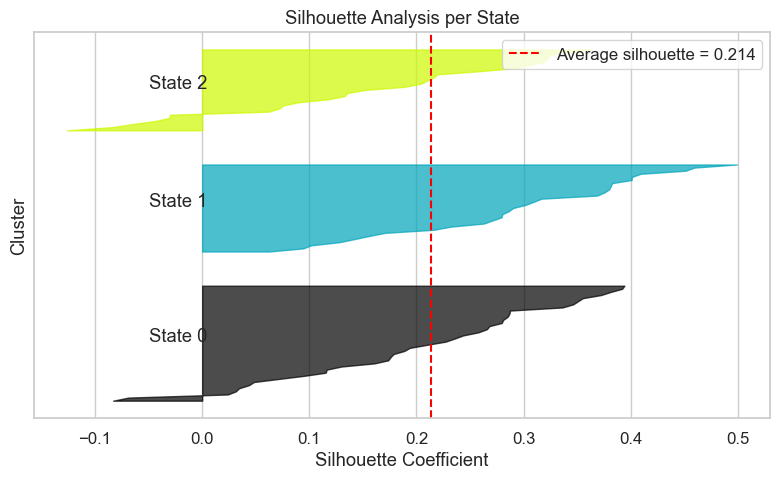


Visualizing stride alignment...


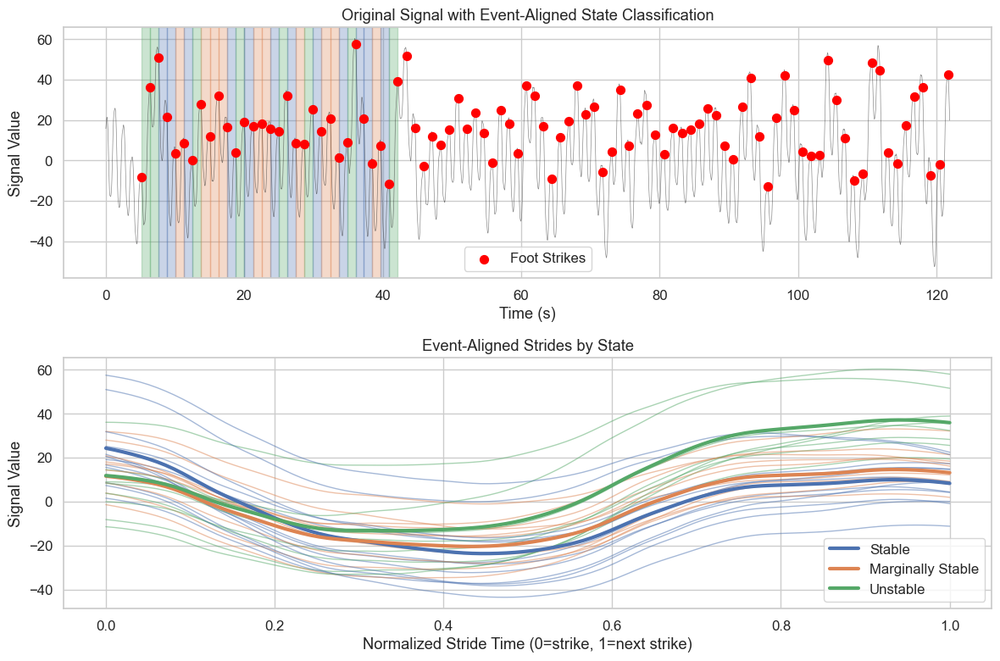

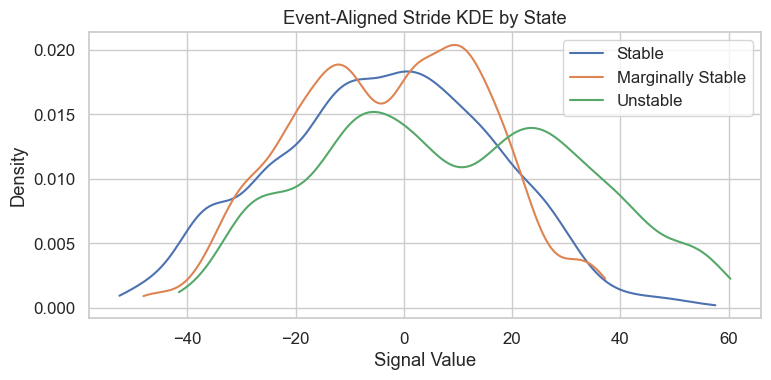

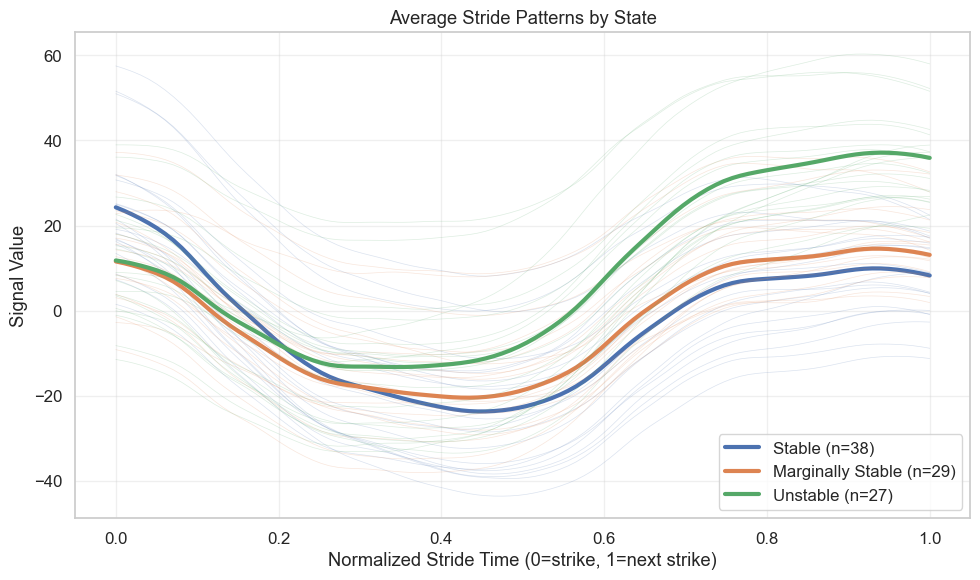

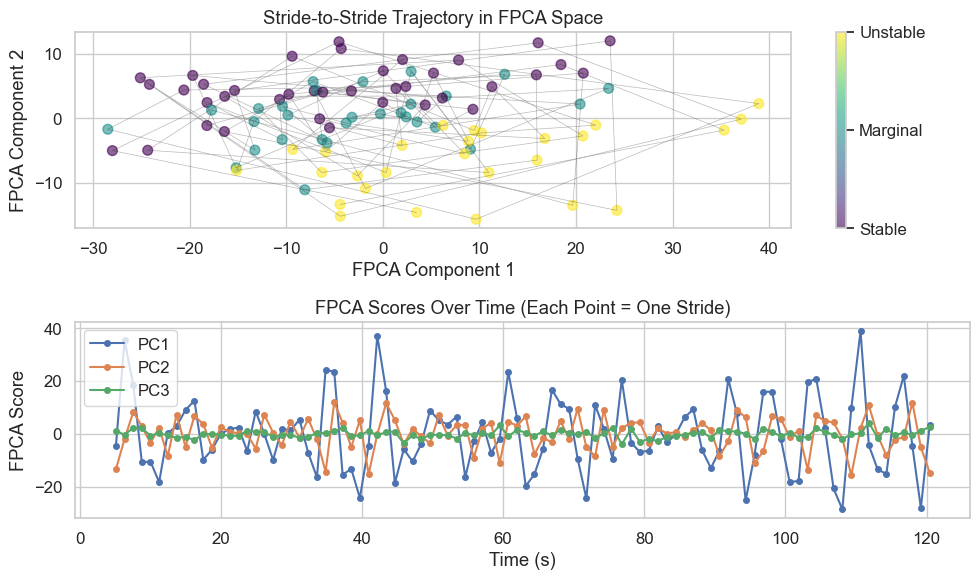

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\1203911502.py:155: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


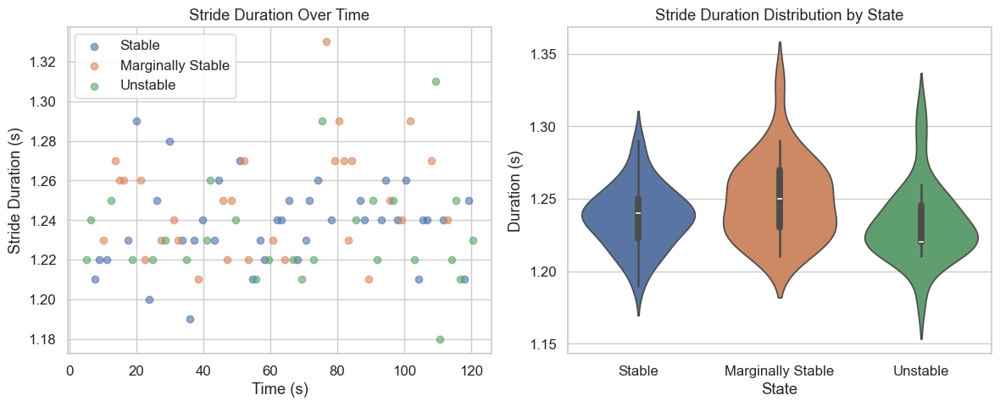

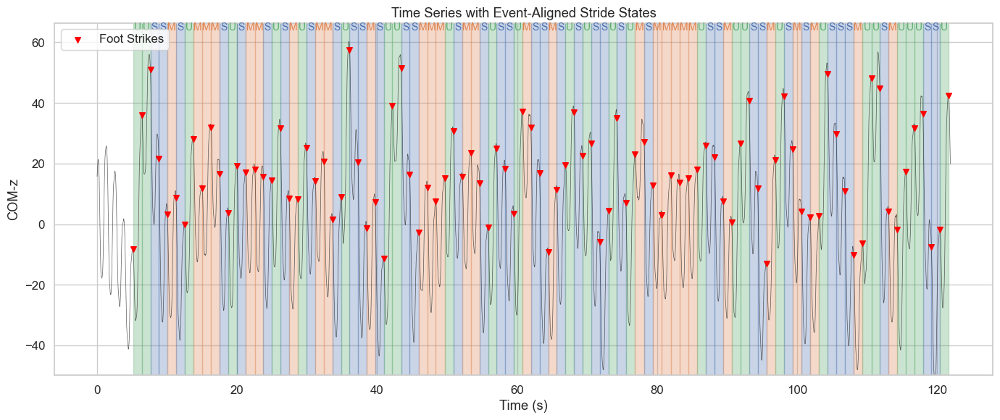


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 94
Average stride duration: 1.240 ± 0.025s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.214
  → Poor clustering - consider different parameters

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.289 0.395 0.316]
 [0.345 0.379 0.276]
 [0.654 0.115 0.231]]

Stationary Distribution Π:
[0.409 0.312 0.28 ]

Mean Dwell Times τ (strides):
[1.407 1.611 1.3  ]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.404
  Mean duration: 1.237s
  Duration std: 0.021s
  Mean PC1: -4.399
  Mean PC2: 4.638
  Mean PC3: 0.775

Marginally Stable:
  Fraction of strides: 0.309
  Mean duration: 1.249s
  Duration std: 0.028s
  Mean PC1: -2.884
  Mean PC2: 0.183
  Mean PC3: -1.476

Unstable:
  Fraction of strides: 0.287
  Mean duration: 1.233s
  Duration std: 0.026s
  Mean PC1: 9.288
  Mean PC2: -6.724
  Mean PC3: 0.495

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 82.3% (cumulative:

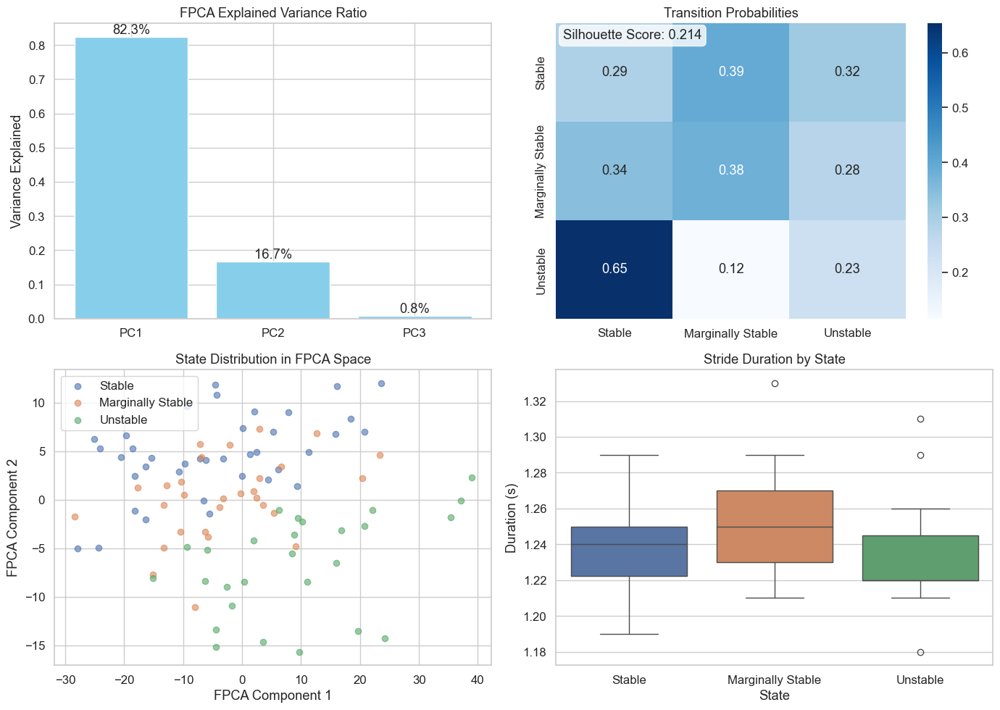

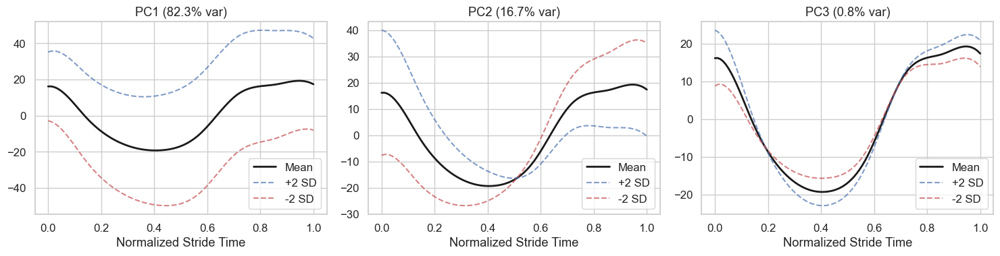


STATE SEQUENCE ANALYSIS

Found 66 state runs

Stable:
  Number of runs: 27
  Mean run length: 1.4 strides
  Max run length: 3 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 18
  Mean run length: 1.6 strides
  Max run length: 5 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 21
  Mean run length: 1.3 strides
  Max run length: 3 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 1/5
Quality Notes:
  • Poor FPCA reconstruction
  • Poorly separated states
  • Balanced state distribution

State Distribution: ['40.4%', '30.9%', '28.7%']
Dominant State: Stable


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal

def main():
    cwd = Path.cwd()
    # marker_file = cwd.parent / ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.3" /"markers.nc"
    # events_file = cwd.parent /  ".." /"data"/"PBT"/"Young"/"Cereneo_SR_14"/"Pre.4" /"events.nc"
    marker_file = cwd.parent / ".." / "data" / "CGA" / "38" / "FWS" / "4"/ "markers.nc"
    events_file = cwd.parent / ".." / "data" / "CGA" / "38" / "FWS" / "4"/ "events.nc"
    fs = 100.0

    # 1) Load & preprocess COM-z
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.1, lp_cutoff=15.0)
    
    # 2) Extract foot strike events
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot strikes 
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="CGA_38_FWS", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=10
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) - now truly stride-based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))): 
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])
    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    # if 'fpca_reconstruction_mse' in msm.validation_metrics:
    #     mse = msm.validation_metrics['fpca_reconstruction_mse']
    #     print(f"FPCA Reconstruction MSE: {mse:.4f}")
    #     if mse < 0.01:
    #         print("  → Excellent FPCA reconstruction quality")
    #     elif mse < 0.1:
    #         print("  → Good FPCA reconstruction quality")
    #     else:
    #         print("  → Poor FPCA reconstruction quality - consider more PCs")
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary, summary_df

if __name__ == "__main__":
    model, metrics,df = main()
   


In [105]:
df.to_excel(cwd.parent /".."/"results"/"tocopy.xlsx", index=False)

# Model Fit - Elderly

### 03

Found 216 foot strikes
Time range: 5.61s to 244.68s
Processing patient E03 with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 215 valid strides
Average stride duration: 1.112s ± 0.044s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 0.4349, RMSE: 0.6595
Signal range: 54.9404, σ: 10.6328
NRMSE (range): 1.20%,  NRMSE (σ): 6.20%
Identifying stability states via K-means...
Clustering silhouette score: 0.218
Clustering quality: Poor clustering
Clustering silhouette score: 0.218
Clustering quality: Poor clustering
FPCA‑KMeans variance explained: 50.2%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for E03:
  frac_state_0: 0.344
  frac_state_1: 0.344
  frac_state_2: 0.312
  mean_fpca_0_state_0: -3.840
  mean_fpca_1_state_0: 0.674
  mean_fpca_2_state_0: 0.326
  mean_fpca_0_state_1: 1.190
  mean_fpca_1_state_1: -3.417
  mean_fpca_2_state_1: -0.140
  mean_fpca_0_state_2: 2.927
  mean_fpca_1_stat

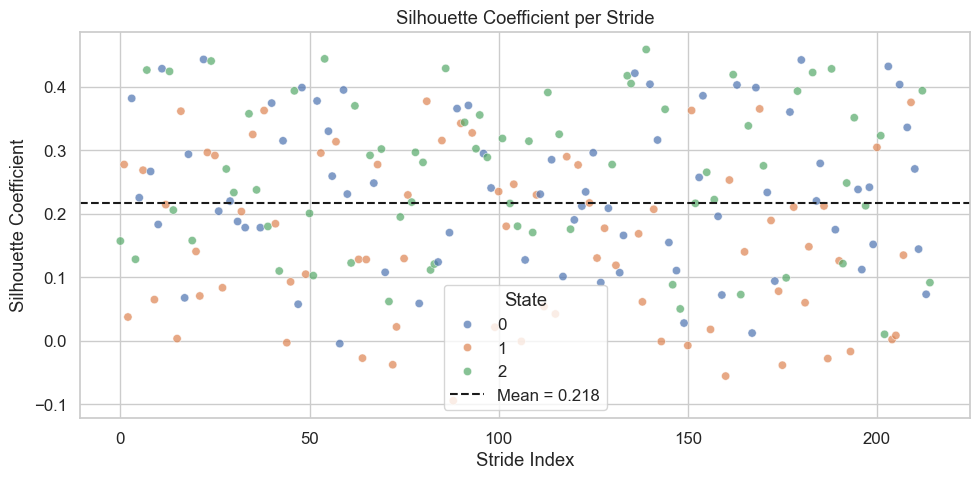

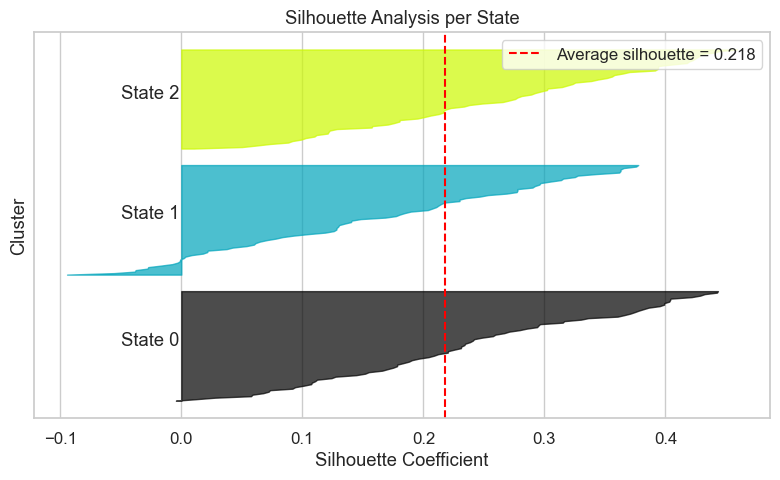


Visualizing stride alignment...


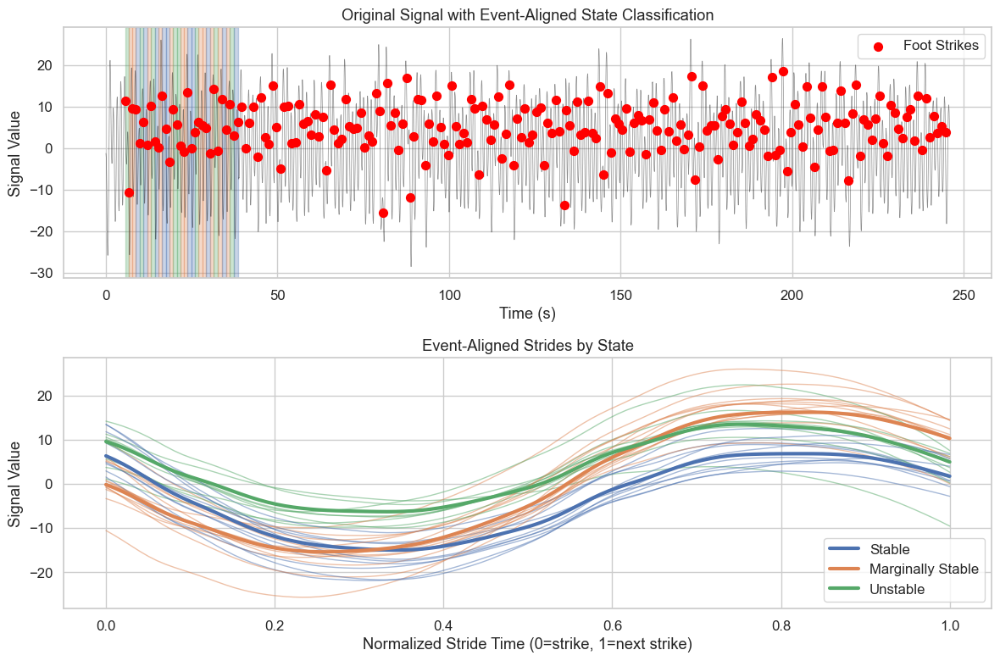

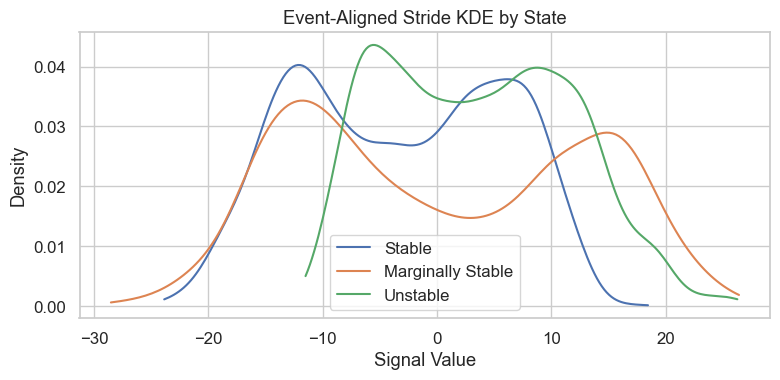

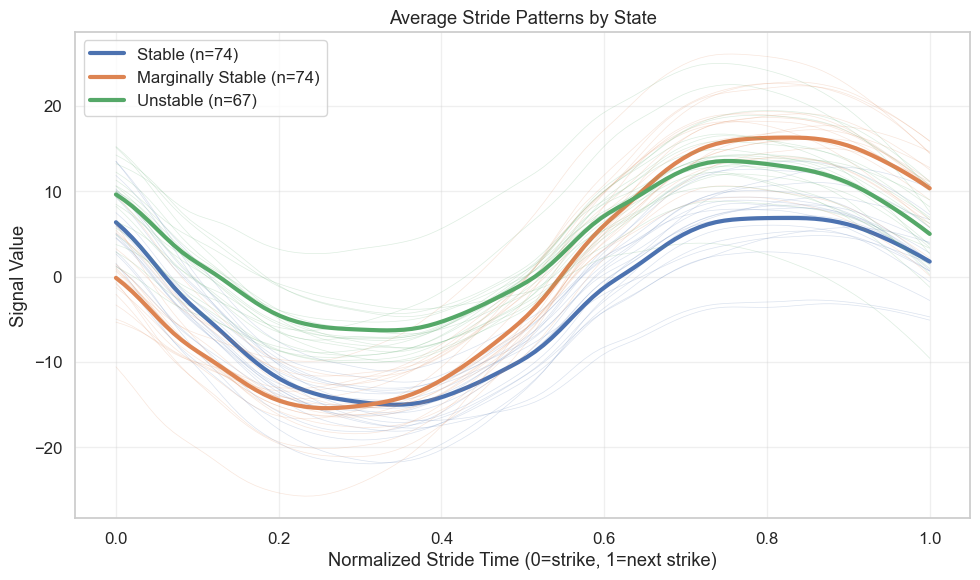

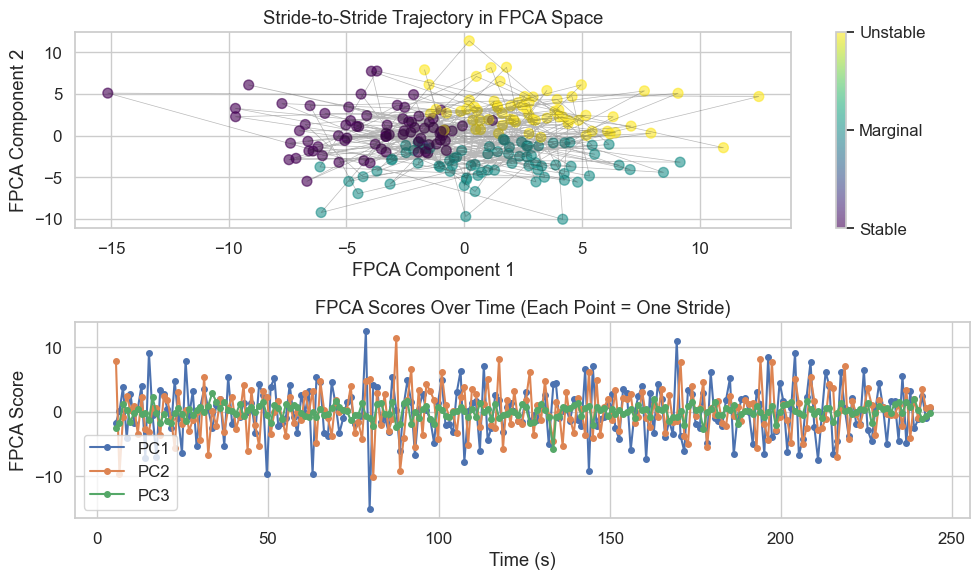

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\1727265012.py:156: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


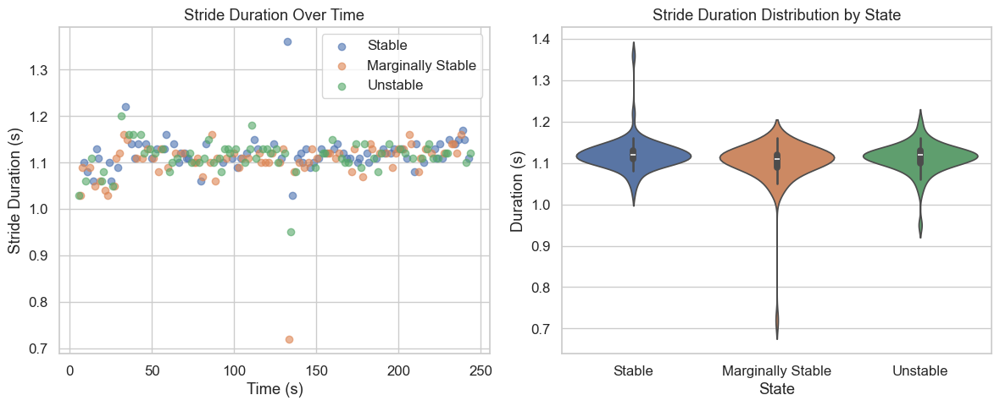

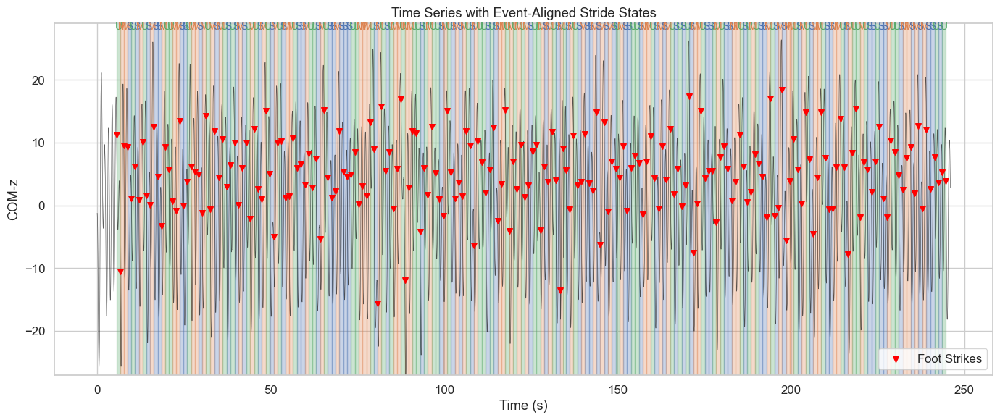


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 215
Average stride duration: 1.112 ± 0.044s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.218
  → Poor clustering - consider different parameters

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.203 0.554 0.243]
 [0.27  0.216 0.514]
 [0.591 0.258 0.152]]

Stationary Distribution Π:
[0.346 0.346 0.308]

Mean Dwell Times τ (strides):
[1.254 1.276 1.179]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.344
  Mean duration: 1.121s
  Duration std: 0.039s
  Mean PC1: -3.840
  Mean PC2: 0.674
  Mean PC3: 0.326

Marginally Stable:
  Fraction of strides: 0.344
  Mean duration: 1.102s
  Duration std: 0.053s
  Mean PC1: 1.190
  Mean PC2: -3.417
  Mean PC3: -0.140

Unstable:
  Fraction of strides: 0.312
  Mean duration: 1.113s
  Duration std: 0.035s
  Mean PC1: 2.927
  Mean PC2: 3.030
  Mean PC3: -0.205

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 55.1% (cumulative

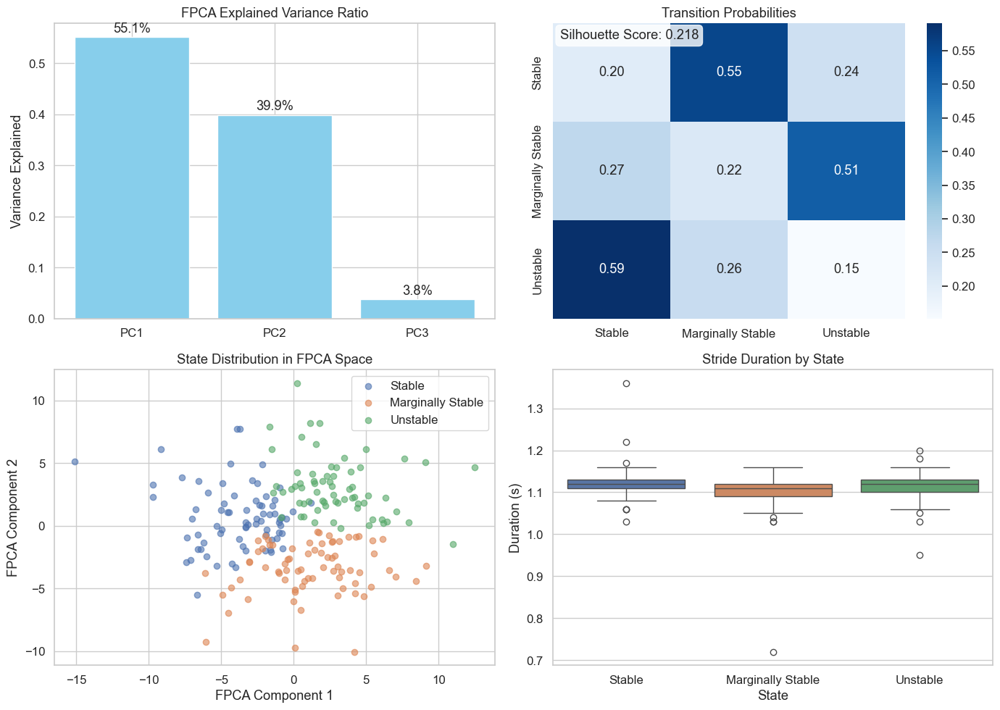

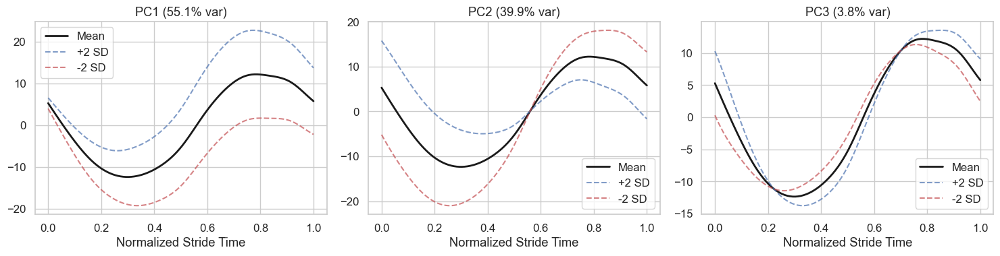


STATE SEQUENCE ANALYSIS

Found 174 state runs

Stable:
  Number of runs: 59
  Mean run length: 1.3 strides
  Max run length: 3 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 58
  Mean run length: 1.3 strides
  Max run length: 3 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 57
  Mean run length: 1.2 strides
  Max run length: 2 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 1/5
Quality Notes:
  • Poor FPCA reconstruction
  • Poorly separated states
  • Balanced state distribution

State Distribution: ['34.4%', '34.4%', '31.2%']
Dominant State: Stable


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal


def main():
    cwd = Path.cwd()
    marker_file = cwd.parent / ".." /"data"/"PBT"/"Elderly"/"03"/"markers.nc"
    events_file = cwd.parent / ".." /"data"/"PBT"/"Elderly"/"03" /"events.nc"
    # marker_file = cwd.parent / ".." / "data" / "CGA" / "04" / "PWS" / "4"/ "markers.nc"
    # events_file = cwd.parent / ".." / "data" / "CGA" / "04" / "PWS" / "4"/ "events.nc"
    fs = 100.0

    # 1) Load & preprocess COM-z
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.2, lp_cutoff=20.0,)
    
    # 2) Extract foot strike events
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot striked
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="E03", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=15
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) - now truly stride-based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))):  # Plot up to 20 strides
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])
    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    # if 'fpca_reconstruction_mse' in msm.validation_metrics:
    #     mse = msm.validation_metrics['fpca_reconstruction_mse']
    #     print(f"FPCA Reconstruction MSE: {mse:.4f}")
    #     if mse < 0.01:
    #         print("  → Excellent FPCA reconstruction quality")
    #     elif mse < 0.1:
    #         print("  → Good FPCA reconstruction quality")
    #     else:
    #         print("  → Poor FPCA reconstruction quality - consider more PCs")
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary,    summary_df

if __name__ == "__main__":
    model, metrics,df = main()
   


In [107]:
df.to_excel(cwd.parent /".."/"results"/"tocopy.xlsx", index=False)

### 12

Found 248 foot strikes
Time range: 5.85s to 244.32s
Processing patient E12 with event-aligned strides...
Creating event-aligned functional data...
Created functional data from 247 valid strides
Average stride duration: 0.965s ± 0.044s
Applying FPCA with 3 components...
FPCA reconstruction MSE: 0.4006, RMSE: 0.6329
Signal range: 53.3008, σ: 15.5029
NRMSE (range): 1.19%,  NRMSE (σ): 4.08%
Identifying stability states via K-means...
Clustering silhouette score: 0.243
Clustering quality: Poor clustering
Clustering silhouette score: 0.243
Clustering quality: Poor clustering
FPCA‑KMeans variance explained: 37.9%
Computing transition matrix...
Computing stationary distribution...

Stability metrics for E12:
  frac_state_0: 0.385
  frac_state_1: 0.364
  frac_state_2: 0.251
  mean_fpca_0_state_0: 1.204
  mean_fpca_1_state_0: 0.235
  mean_fpca_2_state_0: -0.417
  mean_fpca_0_state_1: -0.968
  mean_fpca_1_state_1: -1.019
  mean_fpca_2_state_1: 0.073
  mean_fpca_0_state_2: -0.439
  mean_fpca_1_sta

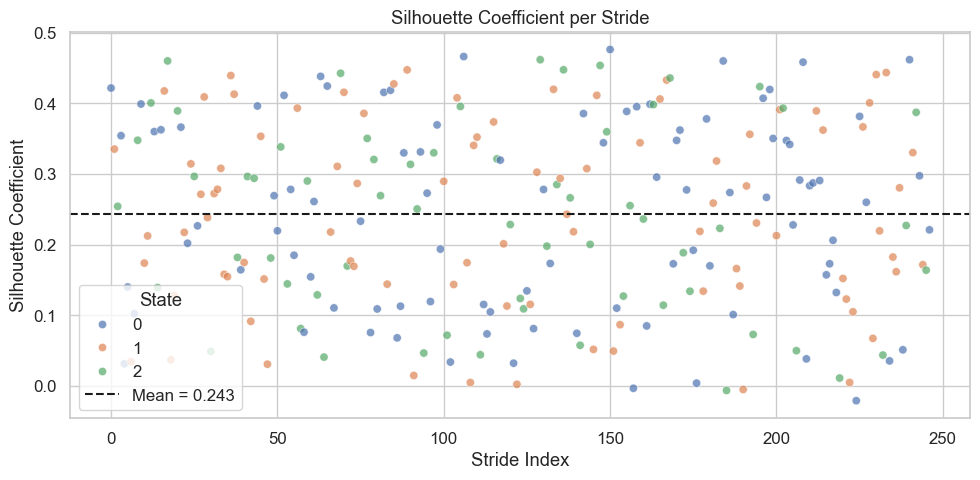

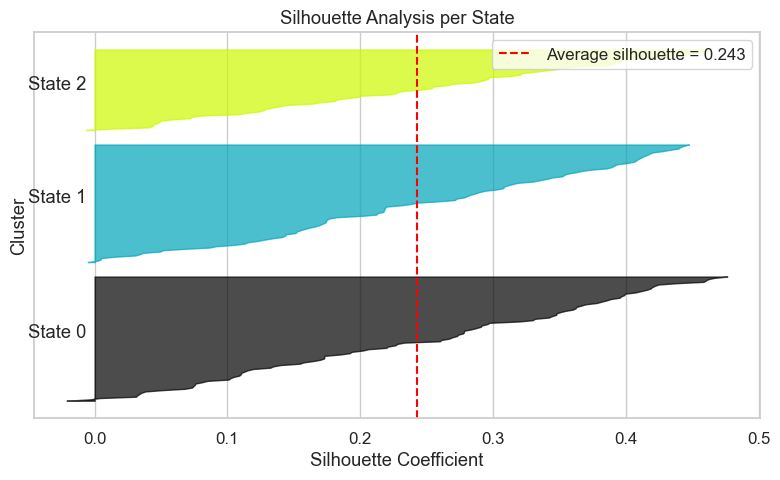


Visualizing stride alignment...


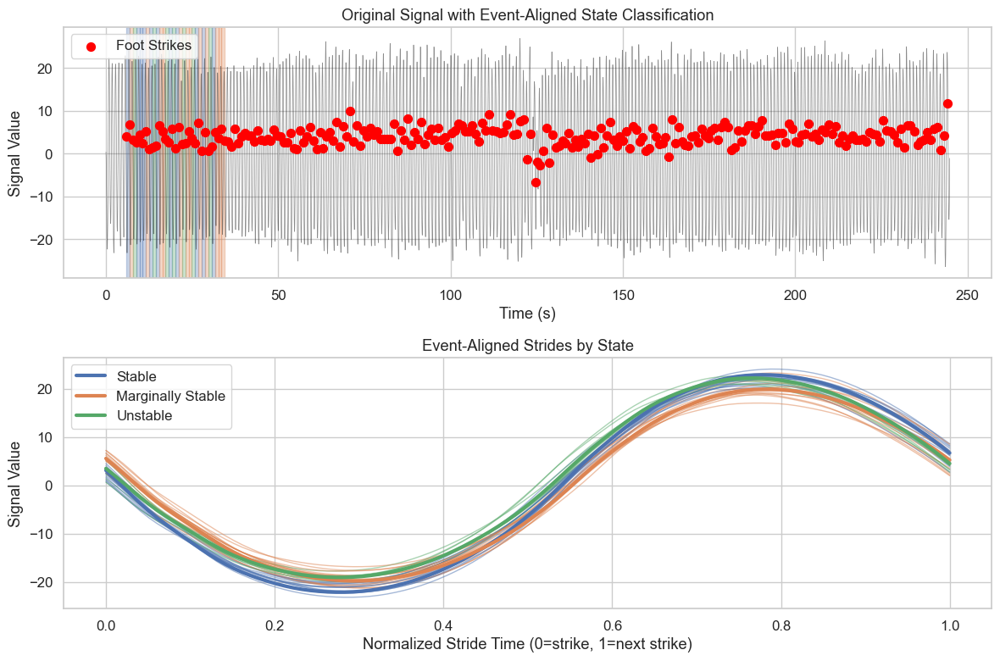

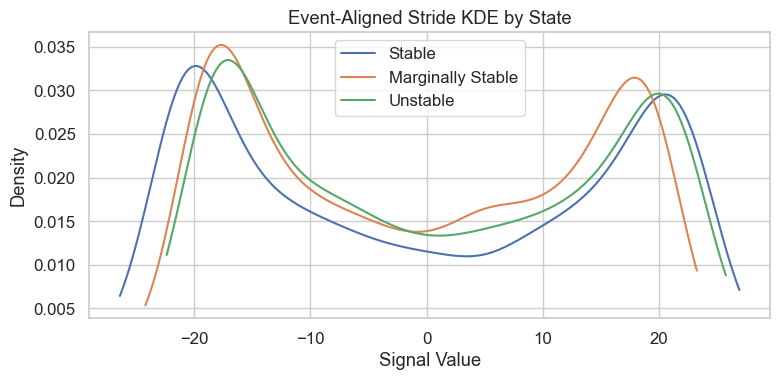

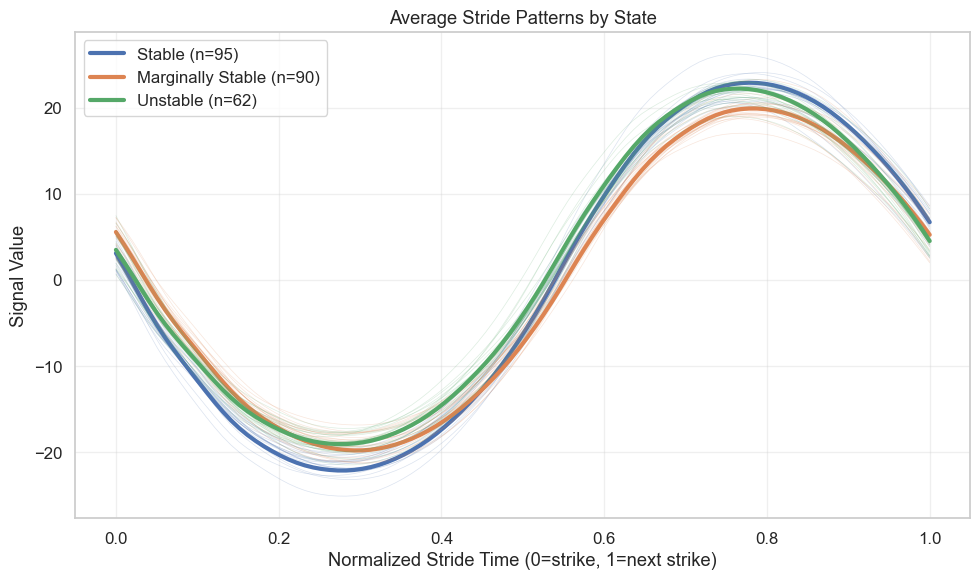

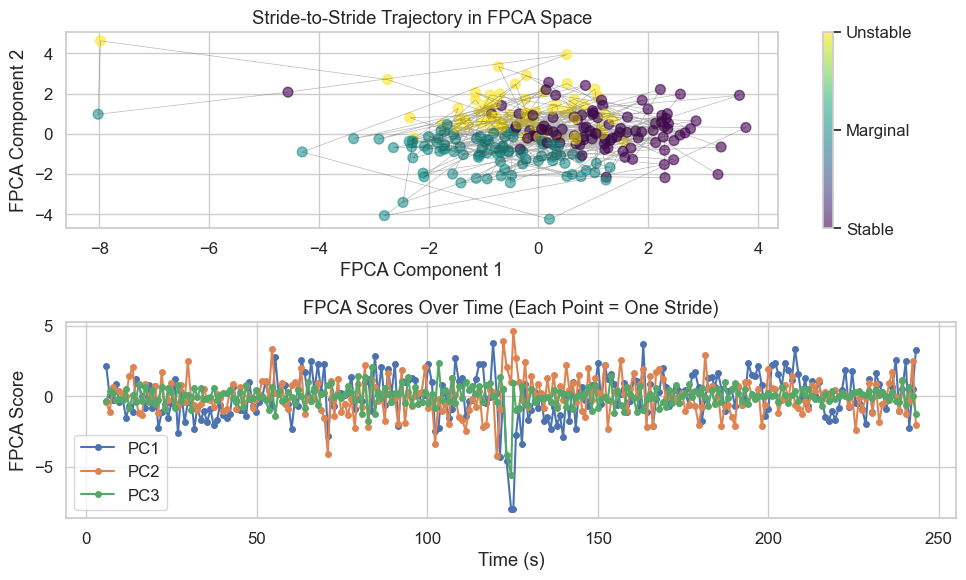

C:\Users\Natascha\AppData\Local\Temp\ipykernel_33000\2799847807.py:156: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)


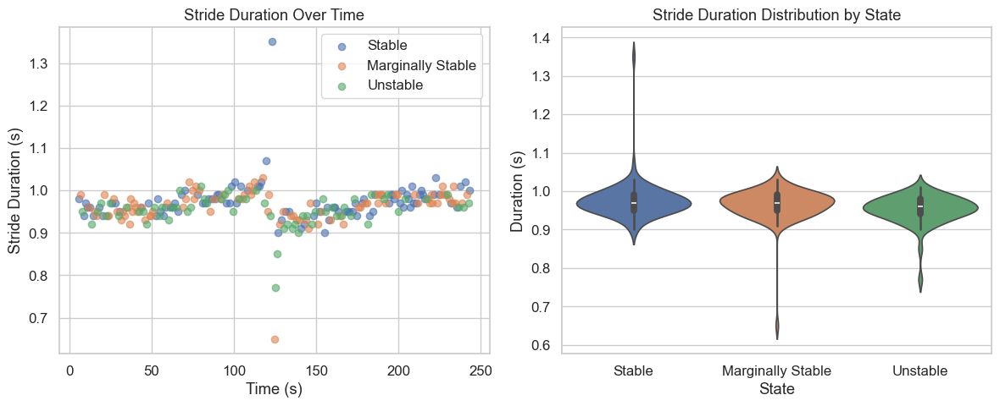

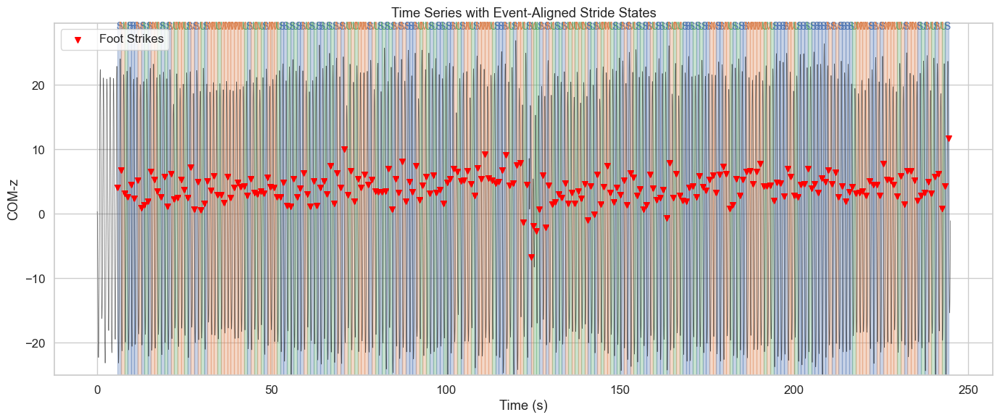


EVENT-ALIGNED FPCA-MSM RESULTS

Total strides analyzed: 247
Average stride duration: 0.965 ± 0.044s

VALIDATION METRICS:
--------------------
Clustering Silhouette Score: 0.243
  → Poor clustering - consider different parameters

TRANSITION ANALYSIS:
--------------------
Transition Matrix T:
[[0.33  0.436 0.234]
 [0.178 0.389 0.433]
 [0.758 0.226 0.016]]

Stationary Distribution Π:
[0.382 0.366 0.252]

Mean Dwell Times τ (strides):
[1.492 1.636 1.016]

STATE STATISTICS:
--------------------

Stable:
  Fraction of strides: 0.385
  Mean duration: 0.975s
  Duration std: 0.048s
  Mean PC1: 1.204
  Mean PC2: 0.235
  Mean PC3: -0.417

Marginally Stable:
  Fraction of strides: 0.364
  Mean duration: 0.965s
  Duration std: 0.043s
  Mean PC1: -0.968
  Mean PC2: -1.019
  Mean PC3: 0.073

Unstable:
  Fraction of strides: 0.251
  Mean duration: 0.952s
  Duration std: 0.037s
  Mean PC1: -0.439
  Mean PC2: 1.121
  Mean PC3: 0.534

FPCA EXPLAINED VARIANCE:
--------------------
PC1: 50.2% (cumulative

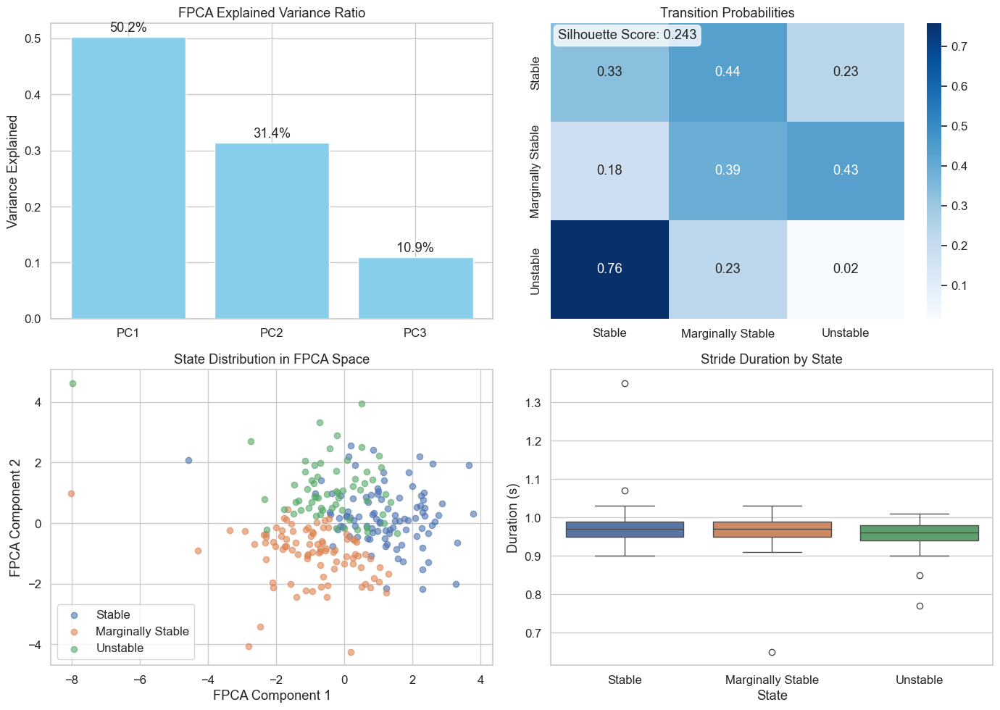

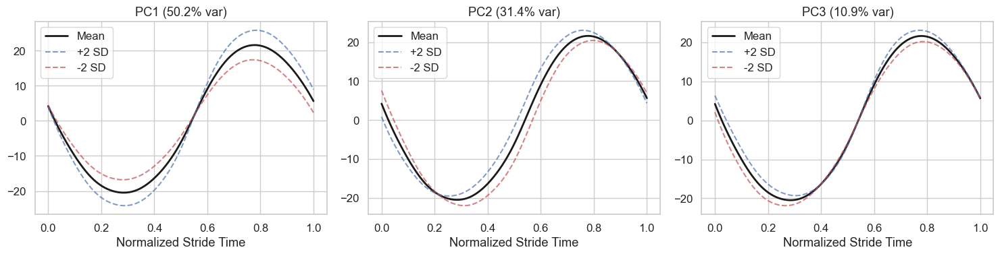


STATE SEQUENCE ANALYSIS

Found 180 state runs

Stable:
  Number of runs: 64
  Mean run length: 1.5 strides
  Max run length: 5 strides
  Min run length: 1 strides

Marginally Stable:
  Number of runs: 55
  Mean run length: 1.6 strides
  Max run length: 7 strides
  Min run length: 1 strides

Unstable:
  Number of runs: 61
  Mean run length: 1.0 strides
  Max run length: 2 strides
  Min run length: 1 strides

Generating validation plots...

SUMMARY ASSESSMENT
Overall Quality Score: 1/5
Quality Notes:
  • Poor FPCA reconstruction
  • Poorly separated states
  • Balanced state distribution

State Distribution: ['38.5%', '36.4%', '25.1%']
Dominant State: Stable


In [ ]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import signal
from scipy.stats import gaussian_kde
from preprocessing import preprocess_signal


def main():
    cwd = Path.cwd()
    marker_file = cwd.parent / ".." /"data"/"PBT"/"Elderly"/"12"/"markers.nc"
    events_file = cwd.parent / ".." /"data"/"PBT"/"Elderly"/"12" /"events.nc"
    # marker_file = cwd.parent / ".." / "data" / "CGA" / "04" / "PWS" / "4"/ "markers.nc"
    # events_file = cwd.parent / ".." / "data" / "CGA" / "04" / "PWS" / "4"/ "events.nc"
    fs = 100.0

    # 1) Load & preprocess COM-z
    ds = xr.open_dataset(marker_file)
    da = ds["markers"] if "markers" in ds else ds
    raw = da.sel(channel="COM").sel(axis="x").values
    ts = preprocess_signal(raw, fs, poly_order=1,hp_cutoff=0.5, lp_cutoff=20.0,)
    
    # 2) Extract foot strike events
    ev_ds = xr.open_dataset(events_file)
    ev_da = ev_ds["events"] if "events" in ev_ds else ev_ds
    df_ev = ev_da.to_dataframe().reset_index()
    
    # Get right foot strikes
    strikes = np.sort(df_ev.query("label=='Foot Strike' & context=='Right' & time>=5")["time"].values)
    print(f"Found {len(strikes)} foot strikes")
    print(f"Time range: {strikes[0]:.2f}s to {strikes[-1]:.2f}s")
    
    # 3) Build & run Event-Aligned FPCA-MSM
    msm = EventAlignedFPCA_MSM_RMCE(
        patient_id="E12", 
        n_states=3,
        n_grid_points=100,  # Interpolate each stride to 100 points
        n_components=3,
        n_basis=15
    )
    
    # Fit the model with events
    msm.fit(ts, strikes, fs)
    df = msm.metrics_history
    states = df['state'].values
    msm.plot_fpca_reconstruction_error_distribution()
    msm.plot_silhouette_samples()
    msm.plot_silhouette_analysis()
    # Get colors and labels
    colors = sns.color_palette(n_colors=3)
    cmap = {i: colors[i] for i in range(3)}
    
    # 1) Show stride alignment visualization
    print("\nVisualizing stride alignment...")
    msm.visualize_stride_alignment(ts, max_strides=30)
    
    # 2) Overlaid kernel-density estimates (KDEs) - now truly stride-based
    plt.figure(figsize=(8, 4))
    for st, label in msm.state_labels.items():
        # Get all signal values from strides in this state
        state_mask = df['state'] == st
        state_strides = msm.fdata[state_mask]
        
        if len(state_strides) > 0:
            # Flatten all values from strides in this state
            all_values = state_strides.data_matrix.flatten()
            kde = gaussian_kde(all_values)
            xs = np.linspace(all_values.min(), all_values.max(), 200)
            plt.plot(xs, kde(xs), color=colors[st], label=label)
    
    plt.xlabel("Signal Value")
    plt.ylabel("Density")
    plt.title("Event-Aligned Stride KDE by State")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 3) Average stride curves by state
    plt.figure(figsize=(10, 6))
    grid = np.linspace(0, 1, msm.n_grid_points)
    
    for state, name in msm.state_labels.items():
        state_mask = df['state'] == state
        if state_mask.sum() > 0:
            # Plot individual strides
            state_strides = msm.fdata[state_mask]
            for i in range(min(20, len(state_strides))):  # Plot up to 20 strides
                plt.plot(grid, state_strides[i].data_matrix[0], 
                        color=colors[state], alpha=0.2, linewidth=0.5)
            
            # Plot mean stride
            mean_stride = np.mean(state_strides.data_matrix, axis=0)
            plt.plot(grid, mean_stride, color=colors[state], 
                    linewidth=3, label=f'{name} (n={state_mask.sum()})')
    
    plt.xlabel("Normalized Stride Time (0=strike, 1=next strike)")
    plt.ylabel("Signal Value")
    plt.title("Average Stride Patterns by State")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4) FPCA scores trajectory plot
    plt.figure(figsize=(10, 6))
    if msm.n_components >= 2:
        # Plot trajectory in FPCA space
        plt.subplot(2, 1, 1)
        scatter = plt.scatter(df['fpca_0'], df['fpca_1'], 
                            c=df['state'], cmap='viridis', 
                            s=50, alpha=0.6)
        plt.plot(df['fpca_0'], df['fpca_1'], 'k-', alpha=0.3, linewidth=0.5)
        plt.xlabel('FPCA Component 1')
        plt.ylabel('FPCA Component 2')
        plt.title('Stride-to-Stride Trajectory in FPCA Space')
        cbar = plt.colorbar(scatter)
        cbar.set_ticks([0, 1, 2])
        cbar.set_ticklabels(['Stable', 'Marginal', 'Unstable'])
        
        # Plot FPCA scores over time
        plt.subplot(2, 1, 2)
        for i in range(min(3, msm.n_components)):
            plt.plot(df['time'], df[f'fpca_{i}'], 'o-', label=f'PC{i+1}', markersize=4)
        plt.xlabel('Time (s)')
        plt.ylabel('FPCA Score')
        plt.title('FPCA Scores Over Time (Each Point = One Stride)')
        plt.legend()
    plt.tight_layout()
    plt.show()

    # 5) Stride duration analysis
    plt.figure(figsize=(12, 5))
    
    # Duration over time colored by state
    plt.subplot(1, 2, 1)
    for state in range(msm.n_states):
        mask = df['state'] == state
        plt.scatter(df.loc[mask, 'time'], df.loc[mask, 'duration'], 
                   color=colors[state], label=msm.state_labels[state], alpha=0.6)
    plt.xlabel('Time (s)')
    plt.ylabel('Stride Duration (s)')
    plt.title('Stride Duration Over Time')
    plt.legend()
    
    # Duration distribution by state
    plt.subplot(1, 2, 2)
    duration_data = []
    for state, name in msm.state_labels.items():
        durations = df[df.state == state]['duration'].values
        duration_data.extend([{'State': name, 'Duration': d} for d in durations])
    
    duration_df = pd.DataFrame(duration_data)
    sns.violinplot(data=duration_df, x='State', y='Duration', palette=colors)
    plt.title('Stride Duration Distribution by State')
    plt.ylabel('Duration (s)')
    plt.tight_layout()
    plt.show()

    # 6) Time series with stride-by-stride state labels
    plt.figure(figsize=(14, 6))
    times = np.arange(len(ts)) / fs
    plt.plot(times, ts, 'k-', linewidth=0.5, alpha=0.7)
    
    # Color each stride
    letters = {0: "S", 1: "M", 2: "U"}
    for idx in range(len(df)):
        stride_info = df.iloc[idx]
        event_idx = stride_info['original_event_idx']
        
        if pd.notnull(event_idx):
            event_idx = int(event_idx)
            if event_idx < len(strikes) - 1:
                start_time = strikes[event_idx]
                end_time = strikes[event_idx + 1]
                state = int(stride_info['state'])
                
                plt.axvspan(start_time, end_time, color=cmap[state], alpha=0.3)
                
                # Add state label at midpoint
                mid_time = (start_time + end_time) / 2
                plt.text(mid_time, ts.max() * 1.05, letters[state],
                        ha='center', va='bottom', color=cmap[state], fontsize=10)
        
    # Mark foot strikes
    plt.scatter(strikes, np.interp(strikes, times, ts), 
               color='red', s=30, zorder=5, marker='v', label='Foot Strikes')
    
    plt.title("Time Series with Event-Aligned Stride States")
    plt.xlabel("Time (s)")
    plt.ylabel("COM-z")
    plt.ylim(ts.min() * 0.95, ts.max() * 1.1)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 7) Compute and print metrics
    T = msm.transition_matrix
    pi = msm.stationary_dist
    tau = msm.compute_mean_dwell_times()
    summary = msm.compute_stability_metrics()
    summary_df = pd.DataFrame([summary])
    print("\n" + "="*50)
    print("EVENT-ALIGNED FPCA-MSM RESULTS")
    print("="*50)
    print(f"\nTotal strides analyzed: {len(df)}")
    print(f"Average stride duration: {df['duration'].mean():.3f} ± {df['duration'].std():.3f}s")
    
    # Print validation metrics first
    print("\nVALIDATION METRICS:")
    print("-" * 20)
    # if 'fpca_reconstruction_mse' in msm.validation_metrics:
    #     mse = msm.validation_metrics['fpca_reconstruction_mse']
    #     print(f"FPCA Reconstruction MSE: {mse:.4f}")
    #     if mse < 0.01:
    #         print("  → Excellent FPCA reconstruction quality")
    #     elif mse < 0.1:
    #         print("  → Good FPCA reconstruction quality")
    #     else:
    #         print("  → Poor FPCA reconstruction quality - consider more PCs")
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        print(f"Clustering Silhouette Score: {sil:.3f}")
        if sil > 0.7:
            print("  → Strong, well-separated clusters")
        elif sil > 0.5:
            print("  → Reasonable clustering quality")
        elif sil > 0.25:
            print("  → Weak clustering - states may overlap")
        else:
            print("  → Poor clustering - consider different parameters")
    
    print("\nTRANSITION ANALYSIS:")
    print("-" * 20)
    print("Transition Matrix T:")
    print(np.round(T, 3))
    print("\nStationary Distribution Π:")
    print(np.round(pi, 3))
    print("\nMean Dwell Times τ (strides):")
    print(np.round(tau, 3))
    
    print("\nSTATE STATISTICS:")
    print("-" * 20)
    for i in range(msm.n_states):
        state_data = df[df['state'] == i]
        print(f"\n{msm.state_labels[i]}:")
        print(f"  Fraction of strides: {len(state_data)/len(df):.3f}")
        print(f"  Mean duration: {state_data['duration'].mean():.3f}s")
        print(f"  Duration std: {state_data['duration'].std():.3f}s")
        if msm.fpca is not None:
            for j in range(min(3, msm.n_components)):
                print(f"  Mean PC{j+1}: {state_data[f'fpca_{j}'].mean():.3f}")
    
    # Print FPCA-specific metrics
    if msm.fpca is not None and hasattr(msm.fpca, 'explained_variance_ratio_'):
        print("\nFPCA EXPLAINED VARIANCE:")
        print("-" * 20)
        total_var = 0
        for i, var in enumerate(msm.fpca.explained_variance_ratio_):
            total_var += var
            print(f"PC{i+1}: {var:.1%} (cumulative: {total_var:.1%})")
    
    # 8) Show built-in visualizations
    print("\nGenerating summary visualizations...")
    msm.visualize_patient_analysis()
    msm.visualize_functional_modes()
    
    # 9) State sequence analysis
    print("\n" + "="*50)
    print("STATE SEQUENCE ANALYSIS")
    print("="*50)
    
    # Find runs of consecutive states
    state_runs = []
    current_state = states[0]
    run_start = 0
    
    for i in range(1, len(states)):
        if states[i] != current_state:
            state_runs.append({
                'state': current_state,
                'start_idx': run_start,
                'end_idx': i-1,
                'length': i - run_start,
                'start_time': df.iloc[run_start]['time'],
                'end_time': df.iloc[i-1]['time']
            })
            current_state = states[i]
            run_start = i
    
    # Add final run
    state_runs.append({
        'state': current_state,
        'start_idx': run_start,
        'end_idx': len(states)-1,
        'length': len(states) - run_start,
        'start_time': df.iloc[run_start]['time'],
        'end_time': df.iloc[-1]['time']
    })
    
    # Analyze runs
    print(f"\nFound {len(state_runs)} state runs")
    for state in range(msm.n_states):
        runs = [r for r in state_runs if r['state'] == state]
        if runs:
            lengths = [r['length'] for r in runs]
            print(f"\n{msm.state_labels[state]}:")
            print(f"  Number of runs: {len(runs)}")
            print(f"  Mean run length: {np.mean(lengths):.1f} strides")
            print(f"  Max run length: {np.max(lengths)} strides")
            print(f"  Min run length: {np.min(lengths)} strides")
    
    # 10) Additional validation plots
    print("\nGenerating validation plots...")
    
    # Plot reconstruction quality per stride
    if 'fpca_reconstruction_mse_per_stride' in msm.validation_metrics:
        plt.figure(figsize=(12, 4))
        per_stride_mse = msm.validation_metrics['fpca_reconstruction_mse_per_stride']
        
        plt.subplot(1, 2, 1)
        plt.plot(df['time'], per_stride_mse, 'o-', markersize=3)
        plt.xlabel('Time (s)')
        plt.ylabel('Reconstruction MSE')
        plt.title('FPCA Reconstruction Quality per Stride')
        plt.grid(True, alpha=0.3)
        
        plt.subplot(1, 2, 2)
        for state in range(msm.n_states):
            state_mask = df['state'] == state
            state_mse = per_stride_mse[state_mask]
            plt.hist(state_mse, alpha=0.6, label=msm.state_labels[state], 
                    color=colors[state], bins=20)
        plt.xlabel('Reconstruction MSE')
        plt.ylabel('Count')
        plt.title('Reconstruction Quality by State')
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Summary statistics
    print("\n" + "="*50)
    print("SUMMARY ASSESSMENT")
    print("="*50)
    
    # Overall quality assessment
    quality_score = 0
    quality_notes = []
    
    if 'fpca_reconstruction_mse' in msm.validation_metrics:
        mse = msm.validation_metrics['fpca_reconstruction_mse']
        if mse < 0.01:
            quality_score += 2
            quality_notes.append("Excellent FPCA reconstruction")
        elif mse < 0.1:
            quality_score += 1
            quality_notes.append("Good FPCA reconstruction")
        else:
            quality_notes.append("Poor FPCA reconstruction")
    
    if 'clustering_silhouette_score' in msm.validation_metrics:
        sil = msm.validation_metrics['clustering_silhouette_score']
        if sil > 0.5:
            quality_score += 2
            quality_notes.append("Well-separated states")
        elif sil > 0.25:
            quality_score += 1
            quality_notes.append("Moderately separated states")
        else:
            quality_notes.append("Poorly separated states")
    
    # Check if states are balanced
    state_fractions = [np.mean(states == i) for i in range(msm.n_states)]
    if min(state_fractions) > 0.1:  # All states have at least 10% of data
        quality_score += 1
        quality_notes.append("Balanced state distribution")
    else:
        quality_notes.append("Imbalanced state distribution")
    
    print(f"Overall Quality Score: {quality_score}/5")
    print("Quality Notes:")
    for note in quality_notes:
        print(f"  • {note}")
    
    print(f"\nState Distribution: {[f'{f:.1%}' for f in state_fractions]}")
    print(f"Dominant State: {msm.state_labels[np.argmax(state_fractions)]}")
    
    return msm, summary,summary_df

if __name__ == "__main__":
    model, metrics,df = main()
   
